 SOLAR FLARES DETECTED
## Analysis

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.signal as signal
import datetime as dt
import os
from matplotlib.dates import DateFormatter
from matplotlib.ticker import MultipleLocator, AutoMinorLocator
import sys
sys.path.append("/home/aldo/notebooks/code/")
import sxrf_download

The following packages are not installed:
['cdflib>=1.3.2']
To install sunpy with these dependencies use `pip install sunpy[timeseries]` or `pip install sunpy[all]` for all extras. 
If you installed sunpy via conda, please report this to the community channel: https://matrix.to/#/#sunpy:openastronomy.org [sunpy.util.sysinfo]


In [10]:
!pip install sunpy[all]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 962.2/962.2 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 3.7 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 MB 6.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.0/15.0 MB 4.6 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 4.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 6.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 6.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 5.9 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 4.4 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


In [2]:
plt.rcParams["font.size"]=14
plt.rcParams["figure.figsize"]=(8,6)

In [7]:
! ls  /data/pavnet/2025/PIURA/data/

2025-05-27  PIU_AMPLITUDE_2025-03-07-to-2025-05-27.csv


In [12]:
datapath = "/data/pavnet/2025/PIURA/data/"
#dnoct21 = "OCT21_4096_flattop_NAA.txt"
#dnjul22 = "JUL22_4096_flattop_NAA.txt"

dndata_path = datapath+'PIU_AMPLITUDE_2025-03-07-to-2025-05-27.csv'

xraysdata = datapath + "xrayflux/"
#savnetdata = datapath + "PLO_250822-010922/SAVNET/PLO-26-07-2022.txt"

In [9]:
dndata_path

'/data/PAVNET/2024/PLO_16112023-26112023/MPCURVES_2023-11-15 18:01:33-2023-11-29 15:45:15_FFT4096pts_ovlp25.csv'

In [18]:

dndata = pd.read_csv(dndata_path,  parse_dates=[0], index_col=[0])

dndata.head()

,NPM,NAA,NLK,NLM,NAU,NPM-filt,NAA-filt,NLK-filt,NLM-filt,NAU-filt
2025-03-07 05:00:07,2.804085,1.316293,0.973761,0.094818,0.000002,2.804085,1.316293,0.973761,0.094818,0.000002
2025-03-07 05:00:17,2.745619,1.308275,0.993759,0.104351,0.000003,2.824662,1.298900,0.977127,0.090437,0.000002
2025-03-07 05:00:27,2.815842,1.259773,0.967159,0.076102,0.000003,2.843241,1.282073,0.981060,0.087121,0.000002
2025-03-07 05:00:36,2.897824,1.279800,0.936262,0.084555,0.000001,2.858111,1.266364,0.985883,0.085715,0.000002
2025-03-07 05:00:46,2.831571,1.289648,1.039614,0.100693,0.000002,2.868109,1.252319,0.991504,0.086660,0.000002


In [19]:
dndata.index.values[0], dndata.index.values[-1]

(np.datetime64('2025-03-07T05:00:07.000000000'),
 np.datetime64('2025-05-27T04:59:45.000000000'))

In [20]:
dndata.head(5)

,NPM,NAA,NLK,NLM,NAU,NPM-filt,NAA-filt,NLK-filt,NLM-filt,NAU-filt
2025-03-07 05:00:07,2.804085,1.316293,0.973761,0.094818,0.000002,2.804085,1.316293,0.973761,0.094818,0.000002
2025-03-07 05:00:17,2.745619,1.308275,0.993759,0.104351,0.000003,2.824662,1.298900,0.977127,0.090437,0.000002
2025-03-07 05:00:27,2.815842,1.259773,0.967159,0.076102,0.000003,2.843241,1.282073,0.981060,0.087121,0.000002
2025-03-07 05:00:36,2.897824,1.279800,0.936262,0.084555,0.000001,2.858111,1.266364,0.985883,0.085715,0.000002
2025-03-07 05:00:46,2.831571,1.289648,1.039614,0.100693,0.000002,2.868109,1.252319,0.991504,0.086660,0.000002


In [21]:
#refmin = np.mean(dndata.min(numeric_only=True))
#refmin=np.mean(dndata.mean(numeric_only=True))

In [22]:
#dndata_sg = pd.DataFrame()
dndata = 20*np.log10(dndata+0.000001)

/home/aldo/jupyterlab-env/lib/python3.12/site-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: invalid value encountered in log10
  result = func(self.values, **kwargs)


In [23]:
dndata

,NPM,NAA,NLK,NLM,NAU,NPM-filt,NAA-filt,NLK-filt,NLM-filt,NAU-filt
2025-03-07 05:00:07,8.955827,2.387059,-0.230946,-20.462047,-109.965039,8.955827,2.387059,-0.230946,-20.462047,-109.965039
2025-03-07 05:00:17,8.772810,2.333985,-0.054368,-19.630010,-107.201313,9.019333,2.271519,-0.200969,-20.872996,-110.356234
2025-03-07 05:00:27,8.992169,2.005851,-0.290033,-22.371970,-108.651713,9.076276,2.158259,-0.166077,-21.197466,-110.645548
2025-03-07 05:00:36,9.241442,2.142846,-0.572043,-21.457118,-112.885745,9.121585,2.051179,-0.123482,-21.338744,-110.730930
2025-03-07 05:00:46,9.040551,2.209431,0.337448,-19.939969,-109.460884,9.151917,1.954309,-0.074100,-21.243481,-110.568487
...,...,...,...,...,...,...,...,...,...,...
2025-05-27 04:59:06,5.462474,1.967755,-0.497570,0.860806,-100.069220,5.583227,2.298798,-0.115604,0.190158,-100.505287
2025-05-27 04:59:16,5.626044,2.425723,0.550065,-0.519713,-101.960880,5.616587,2.169569,-0.016208,0.163312,-100.339094
2025-05-27 04:59:26,6.100126,2.040851,-0.060722,-0.255051,-99.500496,5.615115,1.976706,0.083612,0.171099,-100.394840
2025-05-27 04:59:35,5.759268,1.793047,-0.955806,-0.047434,-101.921232,5.584136,1.732744,0.180709,0.208847,-100.657685


In [25]:
15//2

7

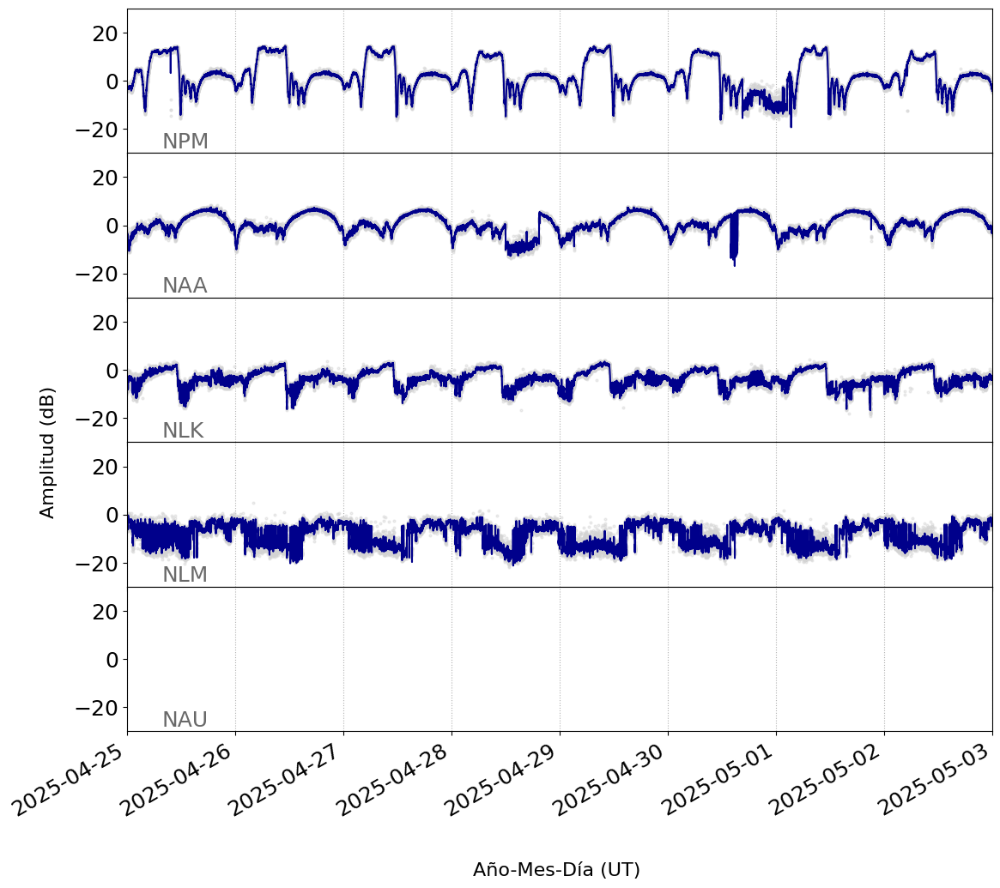

In [63]:
fig, axs = plt.subplots(nrows=len(dndata.columns[:len(dndata.columns)//2]), ncols=1, sharex=True, 
                        sharey=True,figsize=(12,10))
di = dt.datetime(2025,4 ,25)
df = dt.datetime(2025,5,3)

for ii,tx in enumerate(dndata.columns[:len(dndata.columns)//2]):
    axs[ii].plot(dndata[tx], linewidth=0,marker='o', color="lightgray",
                 alpha=0.4, markersize=2)
    axs[ii].plot(dndata[tx+"-filt"],  color="darkblue", )
    axs[ii].text(0.04,0.035,tx, transform=axs[ii].transAxes, color="dimgray")
    axs[ii].grid(axis="x", linestyle=":")
plt.xlim(di,df)
plt.ylim(bottom=-30, top=30)
fig.autofmt_xdate()
fig.text(-0.1,0.5, "Amplitud (dB)", fontsize=16,transform=axs[3].transAxes, rotation="vertical")
fig.text(0.4,-1., "Año-Mes-Día (UT)", fontsize=16
         ,transform=axs[-1].transAxes)
plt.tight_layout()
plt.subplots_adjust(hspace=0)

In [30]:
plt.rcParams["font.size"]=18

Text(0.5, 1.0, '2025-04-27 00:00:00')

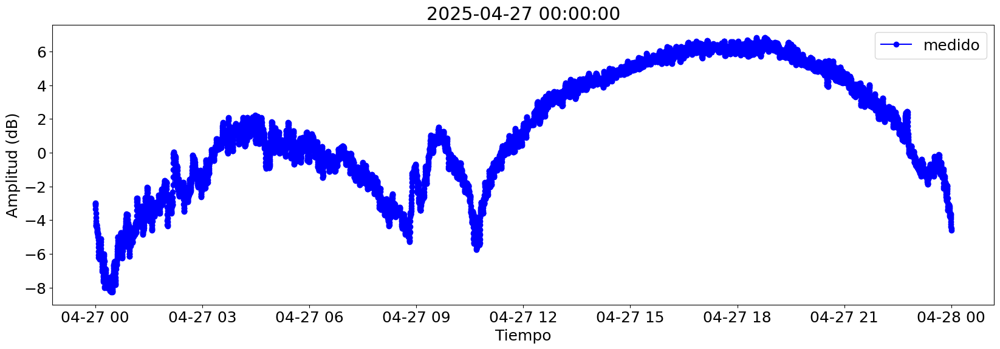

In [76]:
di = dt.datetime(2025, 4,27)
df = dt.datetime(2025, 4, 28)

fig = plt.figure(figsize=(20,6))
plt.plot( dndata['NAA-filt'].loc[di:df], marker="o",color="blue",alpha=1, label="medido")
#plt.plot(timevdn[(di<timevdn) & (timevdn<df)], dndatadb_sg['NAA'].iloc[(di<timevdn) & (timevdn<df)],  color="black", label='suavizado')
#plt.xlim(dt.datetime(2023, 3,31,0), dt.datetime(2023, 4,12))
plt.xlabel("Tiempo")
plt.ylabel("Amplitud (dB)")
plt.legend()
plt.title(di)
#plt.ylim(-20,0)

In [35]:
vlfdata = dndata

In [38]:
tt = vlfdata.index.date

In [40]:
#vlfdata.groupby(vlfdata["DateTime"].dt.date).count()
ttcounts = tt.groupby(tt).count()

AttributeError: 'numpy.ndarray' object has no attribute 'groupby'

In [30]:

ttcounts.index

Index([2023-11-15, 2023-11-16, 2023-11-17, 2023-11-18, 2023-11-19, 2023-11-20,
       2023-11-21, 2023-11-22, 2023-11-23, 2023-11-24, 2023-11-25, 2023-11-26,
       2023-11-27, 2023-11-28, 2023-11-29],
      dtype='object', name='DateTime')

In [39]:
fig = plt.figure()
#plt.hist(tt, rwidth=0.5, align='mid', bins=12)
plt.bar(ttcounts.index,ttcounts.values)
fig.autofmt_xdate()
plt.title("VLF datalength / date")

NameError: name 'ttcounts' is not defined

<Figure size 800x600 with 0 Axes>

In [32]:
sum(ttcounts.values)

9975

In [41]:
dndata.index.values[0], dndata.index.values[-1]

(np.datetime64('2025-03-07T05:00:07.000000000'),
 np.datetime64('2025-05-27T04:59:45.000000000'))

# Loading XrAYS

In [47]:

xrdata = sxrf_download.sunpy_xrf("2025-03-07", "2025-05-27", sat_number=18) #pd.to_datetime(xrdata["DateTime"])


Files Downloaded:   0%|          | 0/82 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g18_d20250310_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

Exception ignored in: <function BaseEventLoop.__del__ at 0x7aa725d47060>
Traceback (most recent call last):
  File "/usr/lib/python3.12/asyncio/base_events.py", line 728, in __del__
    self.close()
  File "/usr/lib/python3.12/asyncio/unix_events.py", line 71, in close
    self.remove_signal_handler(sig)
  File "/usr/lib/python3.12/asyncio/unix_events.py", line 160, in remove_signal_handler
    signal.signal(sig, handler)
  File "/usr/lib/python3.12/signal.py", line 58, in signal
    handler = _signal.signal(_enum_to_int(signalnum), _enum_to_int(handler))
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
ValueError: signal only works in main thread of the main interpreter


sci_xrsf-l2-avg1m_g18_d20250307_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250308_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250311_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250309_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250312_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250313_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250314_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250316_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250315_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250317_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250318_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250319_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250320_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250321_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250322_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250323_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250324_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250325_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250326_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250327_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250328_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250329_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250330_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250331_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250401_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250402_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250403_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250404_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250405_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250406_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250407_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250408_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250409_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250410_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250411_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250412_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250413_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250414_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250415_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250416_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250417_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250418_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250419_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250420_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250421_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250422_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250424_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250423_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250425_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250426_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250427_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250428_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250429_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250430_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250501_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250502_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250503_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250504_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250505_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250507_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250506_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250508_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250509_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250510_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250511_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250512_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250513_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250514_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250515_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250516_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250517_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250518_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250519_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250521_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250520_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250522_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250523_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250524_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250526_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250525_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g18_d20250527_v2-2-0.nc:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

In [53]:
xrdata.head()

,GOES-18_short,GOES-18_long,xrsa_quality,xrsb_quality
DateTime,,,,
2025-03-07 00:00:00,1.000000e-09,8.378985e-07,4,0
2025-03-07 00:01:00,1.000000e-09,8.639828e-07,4,0
2025-03-07 00:02:00,1.000000e-09,8.688834e-07,4,0
2025-03-07 00:03:00,1.000000e-09,8.763887e-07,4,0
2025-03-07 00:04:00,1.000000e-09,8.872662e-07,4,0


<Axes: xlabel='DateTime'>

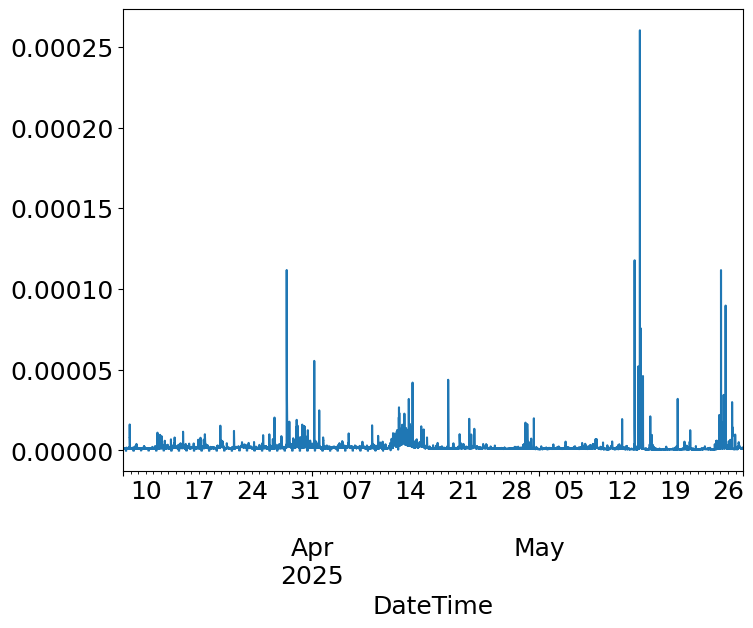

In [49]:
xrdata.sort_index(inplace=True)
xrdata["GOES-18_long"].plot()

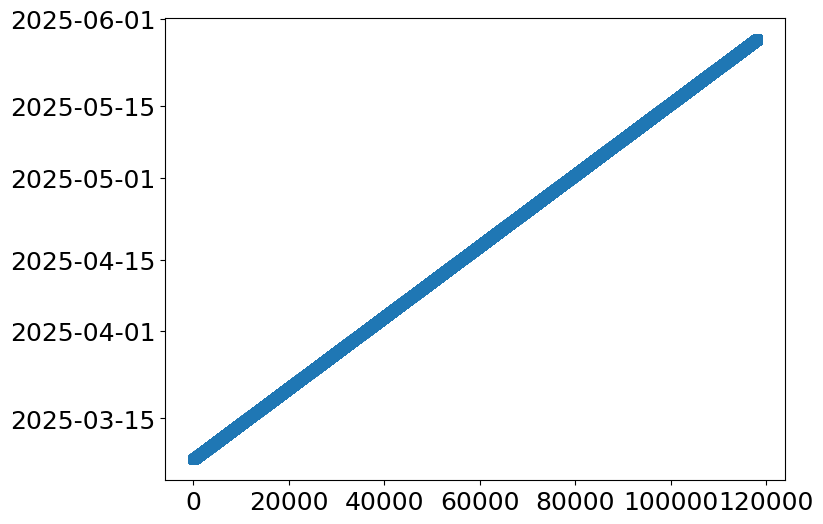

In [51]:
#xrdata = xrdata.sort_values(by=["DateTime"])
#xrdata = xrdata[(dt.datetime(2023, 1,26)<xrdata["DateTime"]) & (xrdata["DateTime"]<dt.datetime(2023, 2,7))]
plt.plot(xrdata.index.values, 's')


# loaing Savnet data

In [33]:
fnames = os.listdir(datapath+'/SAVNET_2608-0209')
fnames

FileNotFoundError: [Errno 2] No such file or directory: '/data/PAVNET/2024/PLO_PAVNET29112023//SAVNET_2608-0209'

In [26]:
datapath

'/data/Datos_PLO/PLO/2023/PLO_220623-020723/'

In [24]:
fdates = []
tvsavnet, ampsavnet = [], []
datasavnet = pd.DataFrame()
for fn in fnames:
    print(fn)
    x = fn.split(".")[0].split('-')[1:]
    t_ = dt.datetime(int(x[-1]),int(x[-2]), int(x[-3]))
    x = pd.read_csv(datapath+'/SAVNET_2608-0209/'+fn, delimiter='\t', skiprows=4)#np.loadtxt(datapath+'/SAVNET_2608-0209/'+fn, delimiter='\t', skiprows=5)
    #ts, amp = x[:, 0], x[:, 1] 
    datasavnet = datasavnet.append(x, ignore_index=True)
    tvsavnet += [t_ + dt.timedelta(seconds=ss) for ss in x[x.columns[0]]]
    #ampsavnet += list(x[:,1])
tvsavnet = np.asarray(tvsavnet)
datasavnet["DateTime"] = tvsavnet

#ampsavnet = np.asarray(ampsavnet)

NameError: name 'fnames' is not defined

In [24]:
datasavnet

,Range=,60.00 dB,DateTime
0,0.0,20.31,2022-08-27 00:00:00
1,1.0,20.16,2022-08-27 00:00:01
2,2.0,20.42,2022-08-27 00:00:02
3,3.0,20.48,2022-08-27 00:00:03
4,4.0,19.95,2022-08-27 00:00:04
...,...,...,...
691195,86395.0,19.54,2022-08-29 23:59:55
691196,86396.0,19.82,2022-08-29 23:59:56
691197,86397.0,19.68,2022-08-29 23:59:57
691198,86398.0,19.79,2022-08-29 23:59:58


In [25]:
datasavnet.sort_values("DateTime", inplace=True)
datasavnet

,Range=,60.00 dB,DateTime
518400,0.0,19.60,2022-08-26 00:00:00
518401,1.0,19.60,2022-08-26 00:00:01
518402,2.0,19.65,2022-08-26 00:00:02
518403,3.0,19.55,2022-08-26 00:00:03
518404,4.0,19.55,2022-08-26 00:00:04
...,...,...,...
345595,86395.0,19.43,2022-09-02 23:59:55
345596,86396.0,19.37,2022-09-02 23:59:56
345597,86397.0,18.89,2022-09-02 23:59:57
345598,86398.0,19.23,2022-09-02 23:59:58


numpy.datetime64('2022-09-01')

# Solar Flares

### M & C Type Solar Flares

<>:22: SyntaxWarning: invalid escape sequence '\m'
<>:22: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_874012/2416639402.py:22: SyntaxWarning: invalid escape sequence '\m'
  plt.ylabel("Flujo de Rayos X ($\mu Wm^{-2}$)")


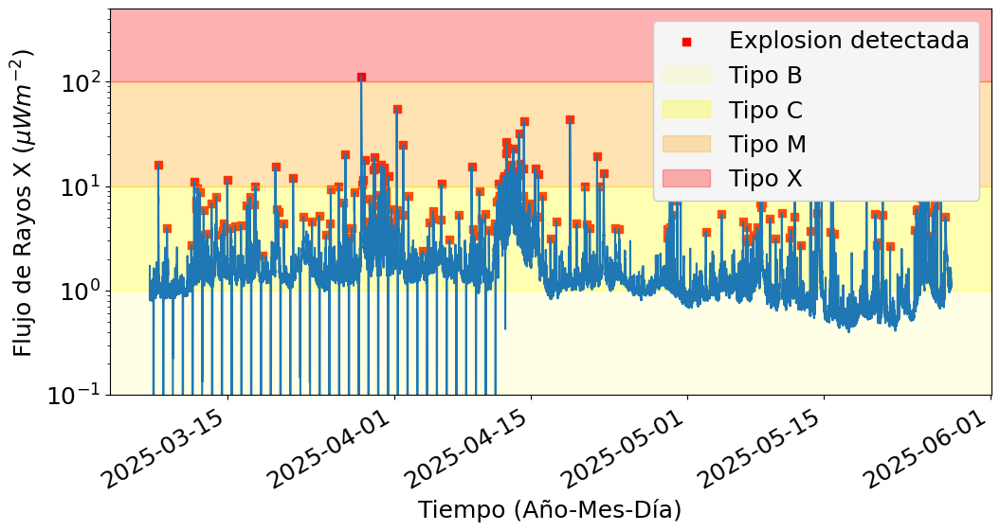

In [57]:
# finding peaks -> explosions
c = 1e6
threshold_C = [1]
peaks_c, x_c = signal.find_peaks(xrdata["GOES-18_long"].values*c,rel_height=10,distance=5, prominence=2)


fig = plt.figure(figsize=(12, 6))


plt.plot( xrdata["GOES-18_long"]*c)
#plt.scatter(xrdata['DateTime'].iloc[peaks_c], xrdata["GOES-18_long"].iloc[peaks_c]*c, marker='s', c="red",label="Explosion detectada")
plt.scatter(xrdata.index.values[peaks_c], xrdata.iloc[peaks_c, 1]*c, marker='s', c="red",label="Explosion detectada")
fig.autofmt_xdate()

# C class flare region
plt.axhspan(1e-7*c,1e-6*c, color="yellow", alpha=0.1, label="Tipo B")
plt.axhspan(1e-6*c,1e-5*c, color="yellow", alpha=0.3, label="Tipo C")
plt.axhspan(1e-5*c,1e-4*c, color="orange", alpha=0.3, label="Tipo M")
plt.axhspan(1e-4*c, 1e-3*c , color="red", alpha=0.3, label="Tipo X")
#plt.axhspan(1e-5,1e-5, color="yellow", alpha=0.3)
plt.legend(framealpha=1,facecolor='whitesmoke')
plt.ylabel("Flujo de Rayos X ($\mu Wm^{-2}$)")
plt.xlabel("Tiempo (Año-Mes-Día)")
plt.ylim(0.1,500)
plt.yscale("log")
#plt.xlim(dt.datetime(2022,8,30,9), dt.datetime(2022,8,31))

In [99]:
x_c

{'prominences': array([ 16.00815983,   3.9554477 ,   2.58630259,  10.8968063 ,
          4.96096539,   5.70161736,   8.46672821,   7.51390314,
          2.32875073,   4.83148634,   2.2306509 ,   5.7331022 ,
          7.93135393,   2.1336658 ,   2.3336693 ,   3.12671614,
         11.44473975,   2.8277601 ,   3.03195596,   4.21895047,
          5.39838576,   7.75833708,   5.29710197,   9.94779865,
          2.13542628,  15.24202621,   4.04876196,   3.2681601 ,
          4.33888447,  11.88047193,   4.92154992,   3.19833457,
          4.1064527 ,   3.31403545,   3.0732311 ,   8.24623966,
          9.90843215,   5.88309526,  20.29844324,   2.7274847 ,
          2.04302442,   2.82680833,   8.74036531, 111.70108433,
          3.24656248,   7.71043062,  15.46758676,   2.04731369,
          2.77070367,   6.12546384,   4.63161635,   4.93649721,
          8.24929667,  18.85916167,  12.68807054,   2.99974227,
          6.82349586,   2.5463531 ,  15.90528906,   4.82420826,
          2.6040442 ,   3

In [35]:
fig.savefig(datapath+"/X-Ray_fux_andflares.png", dpi=300)

In [30]:
#fig.savefig(datapath+'/X-RAY_flux_2_MtypeMarked.png', dpi=300)

In [58]:
flaresdf = xrdata.iloc[peaks_c, 1]


In [37]:
#flaresdf = flaresdf.drop(index=[1600, 5304,5345, 5371, 2974, 3348,5216])
#flaresdf

### Agregando manualmente algunas explosiones

In [38]:
#x = pd.DataFrame(columns=["Tiempo Universal", "GOES-17_long"])
#x.index = 2208
#x["Tiempo Universal"]= pd.to_datetime(["2022-08-27 12:48:00", "2022-08-27 13:13:00", "2022-08-28 01:34:00", "2022-08-29 21:54:00", "2022-08-30 11:43:00" ])
#x["GOES-17_long"] = [0.000009, 0.000010, 0.000015, 0.000006, 0.000003]
#x.index = [2208,2233, 2974, 5634, 6463]

In [39]:
#flaresdf = pd.concat([flaresdf, x])

In [59]:
flaresdf.sort_values("DateTime", inplace =True)
flaresdf

TypeError: Series.sort_values() takes 1 positional argument but 2 positional arguments (and 1 keyword-only argument) were given

In [81]:
#flaresdf.drop(index=[2974, 4538, 5860], inplace=True)

In [61]:
flares_t = flaresdf.index.values
flares_t

array(['2025-03-07T21:00:00.000000000', '2025-03-08T18:25:00.000000000',
       '2025-03-11T05:52:00.000000000', '2025-03-11T13:04:00.000000000',
       '2025-03-11T18:27:00.000000000', '2025-03-11T19:16:00.000000000',
       '2025-03-11T21:22:00.000000000', '2025-03-12T02:31:00.000000000',
       '2025-03-12T09:52:00.000000000', '2025-03-12T12:18:00.000000000',
       '2025-03-12T21:36:00.000000000', '2025-03-13T07:52:00.000000000',
       '2025-03-13T19:35:00.000000000', '2025-03-14T07:20:00.000000000',
       '2025-03-14T11:30:00.000000000', '2025-03-14T14:27:00.000000000',
       '2025-03-14T22:21:00.000000000', '2025-03-15T06:43:00.000000000',
       '2025-03-15T17:41:00.000000000', '2025-03-16T08:03:00.000000000',
       '2025-03-16T22:32:00.000000000', '2025-03-17T05:42:00.000000000',
       '2025-03-17T16:04:00.000000000', '2025-03-17T19:33:00.000000000',
       '2025-03-18T12:27:00.000000000', '2025-03-19T20:40:00.000000000',
       '2025-03-20T00:06:00.000000000', '2025-03-20

# Flares through some VLF

2023-11-15 04:01:00
2023-11-15 12:12:00
2023-11-16 20:22:00
2023-11-18 05:42:00
2023-11-18 10:43:00
2023-11-18 22:33:00
2023-11-19 08:34:00
2023-11-19 22:12:00
2023-11-20 07:06:00
2023-11-20 07:33:00
2023-11-20 09:03:00
2023-11-20 10:14:00
2023-11-20 12:31:00
2023-11-21 01:18:00
2023-11-21 03:45:00
2023-11-21 13:52:00
2023-11-21 23:40:00
2023-11-22 01:11:00
2023-11-22 06:28:00
2023-11-22 16:45:00
2023-11-22 20:26:00
2023-11-23 00:03:00
2023-11-23 03:38:00
2023-11-23 05:44:00
2023-11-23 07:14:00
2023-11-23 13:15:00
2023-11-23 14:37:00
2023-11-23 15:38:00
2023-11-23 19:21:00
2023-11-23 20:39:00
2023-11-23 21:05:00
2023-11-24 09:33:00
2023-11-24 10:42:00
2023-11-24 22:19:00
2023-11-25 14:39:00
2023-11-26 07:44:00
2023-11-27 08:11:00
2023-11-27 18:52:00
2023-11-27 23:39:00
2023-11-28 19:50:00
2023-11-28 23:31:00
2023-11-29 08:03:00
2023-11-29 14:35:00


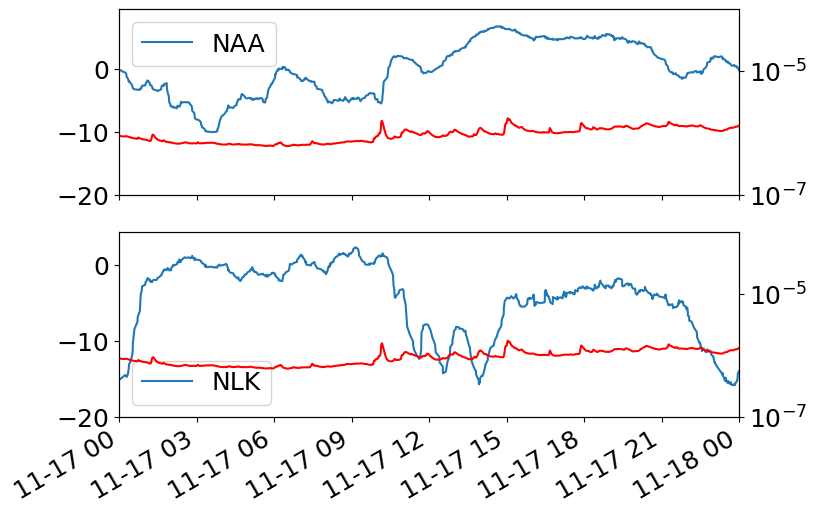

In [45]:
fig = plt.figure(figsize=(8,6))

tx="NAA"
plt.subplot(211)
delta = dt.timedelta(minutes=30)
ax = plt.gca()
plt.plot(vlfdata["DateTime"], vlfdata[tx] , label=tx)
ax2 = ax.twinx()
ax2.plot(xrdata.iloc[:,0], xrdata.iloc[:,2] , label="XRF", color="red")
for tf in flares_t:
    ax.axvspan(tf-delta,tf+delta, color='orange', alpha=0.3)
ax2.set_yscale("log")
ax2.set_ylim(1e-7, 1e-4)
ax.set_ylim(bottom=-20)
ax.legend()
#ax.vlines(x=dt.datetime(2023,11,10,), ymin=-20,ymax=20,  ls="--", color="green")
ax.set_xlim(dt.datetime(2023,11,17), dt.datetime(2023,10,18))

tx = "NLK"
plt.subplot(212, sharex=ax)
delta = dt.timedelta(minutes=30)
ax = plt.gca()
plt.plot(vlfdata["DateTime"], vlfdata[tx] , label=tx)
ax2 = ax.twinx()
ax2.plot(xrdata.iloc[:,0], xrdata.iloc[:,2] , label=tx, color="red")
for tf in flares_t:
    ax.axvspan(tf-delta,tf+delta, color='orange', alpha=0.3)
    print(tf)
ax2.set_yscale("log")
ax2.set_ylim(1e-7, 1e-4)
ax.set_ylim(bottom=-20)
ax.legend()
ax.set_xlim(dt.datetime(2023,11,17), dt.datetime(2023,11,18))
#ax.vlines(x=dt.datetime(2023,10,14,18,40), ymin=-20,ymax=20, ls="--", color="green")
fig.autofmt_xdate()

In [64]:
fig.savefig(datapath+"caso1.png",dpi=500)

### filtrando solo data de día


In [65]:
# unique days
uniquedays = vlfdata.index.normalize().unique()

In [66]:
uniquedays

DatetimeIndex(['2025-03-07', '2025-03-08', '2025-03-09', '2025-03-10',
               '2025-03-11', '2025-03-12', '2025-03-13', '2025-03-14',
               '2025-03-15', '2025-03-16', '2025-03-17', '2025-03-18',
               '2025-03-19', '2025-03-20', '2025-03-21', '2025-03-22',
               '2025-03-23', '2025-03-24', '2025-03-25', '2025-03-26',
               '2025-03-27', '2025-03-28', '2025-03-29', '2025-03-30',
               '2025-03-31', '2025-04-01', '2025-04-02', '2025-04-03',
               '2025-04-04', '2025-04-05', '2025-04-06', '2025-04-07',
               '2025-04-08', '2025-04-09', '2025-04-10', '2025-04-11',
               '2025-04-12', '2025-04-13', '2025-04-14', '2025-04-15',
               '2025-04-16', '2025-04-17', '2025-04-18', '2025-04-19',
               '2025-04-20', '2025-04-21', '2025-04-22', '2025-04-23',
               '2025-04-24', '2025-04-25', '2025-04-26', '2025-04-27',
               '2025-04-28', '2025-04-29', '2025-04-30', '2025-05-01',
      

In [67]:
# finding flares during local time day
t1 = 12
t2 = 22
flares_tday = []
flares_duringlocalday = pd.DataFrame()
for d in uniquedays:
    flares_tday += list(flares_t[(d+np.timedelta64(t1,"h")<flares_t) & (flares_t< d+np.timedelta64(24,"h"))])
    #df = 
flares_tday = pd.to_datetime(flares_tday)

In [68]:
flaresdf_localday = pd.DataFrame()
t1 = 11
t2 = 23
for d in uniquedays:
    print(d)
    idx = flaresdf.index[(d+np.timedelta64(t1,"h")<flaresdf.index) & (flaresdf.index< d+np.timedelta64(t2,"h"))]
    df = flaresdf.loc[idx]
    #print(df.head())
    flaresdf_localday = pd.concat([flaresdf_localday,df])

2025-03-07 00:00:00
2025-03-08 00:00:00
2025-03-09 00:00:00
2025-03-10 00:00:00
2025-03-11 00:00:00
2025-03-12 00:00:00
2025-03-13 00:00:00
2025-03-14 00:00:00
2025-03-15 00:00:00
2025-03-16 00:00:00
2025-03-17 00:00:00
2025-03-18 00:00:00
2025-03-19 00:00:00
2025-03-20 00:00:00
2025-03-21 00:00:00
2025-03-22 00:00:00
2025-03-23 00:00:00
2025-03-24 00:00:00
2025-03-25 00:00:00
2025-03-26 00:00:00
2025-03-27 00:00:00
2025-03-28 00:00:00
2025-03-29 00:00:00
2025-03-30 00:00:00
2025-03-31 00:00:00
2025-04-01 00:00:00
2025-04-02 00:00:00
2025-04-03 00:00:00
2025-04-04 00:00:00
2025-04-05 00:00:00
2025-04-06 00:00:00
2025-04-07 00:00:00
2025-04-08 00:00:00
2025-04-09 00:00:00
2025-04-10 00:00:00
2025-04-11 00:00:00
2025-04-12 00:00:00
2025-04-13 00:00:00
2025-04-14 00:00:00
2025-04-15 00:00:00
2025-04-16 00:00:00
2025-04-17 00:00:00
2025-04-18 00:00:00
2025-04-19 00:00:00
2025-04-20 00:00:00
2025-04-21 00:00:00
2025-04-22 00:00:00
2025-04-23 00:00:00
2025-04-24 00:00:00
2025-04-25 00:00:00


/tmp/ipykernel_874012/1287729705.py:9: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  flaresdf_localday = pd.concat([flaresdf_localday,df])


In [69]:
flaresdf_localday

,GOES-18_long
2025-03-07 21:00:00,0.000016
2025-03-08 18:25:00,0.000004
2025-03-11 13:04:00,0.000011
2025-03-11 18:27:00,0.000006
2025-03-11 19:16:00,0.000007
...,...
2025-05-24 20:23:00,0.000022
2025-05-25 16:30:00,0.000090
2025-05-26 13:06:00,0.000030
2025-05-26 13:37:00,0.000015


In [70]:
flares_t = pd.to_datetime(flares_t)

In [90]:
#%matplotlib qt
%matplotlib inline

<>:56: SyntaxWarning: invalid escape sequence '\m'
<>:56: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_874012/1996412009.py:56: SyntaxWarning: invalid escape sequence '\m'
  twinxs[1].set_ylabel("Flujo de Rayos X ($\mu W/m^2$)")


2025-03-07 00:00:00
2025-03-08 00:00:00
2025-03-09 00:00:00
2025-03-10 00:00:00
2025-03-11 00:00:00
2025-03-12 00:00:00
2025-03-13 00:00:00
2025-03-14 00:00:00
2025-03-15 00:00:00
2025-03-16 00:00:00
2025-03-17 00:00:00
2025-03-18 00:00:00
2025-03-19 00:00:00
2025-03-20 00:00:00
2025-03-21 00:00:00
2025-03-22 00:00:00
2025-03-23 00:00:00
2025-03-24 00:00:00
2025-03-25 00:00:00
2025-03-26 00:00:00
2025-03-27 00:00:00
2025-03-28 00:00:00
2025-03-29 00:00:00
2025-03-30 00:00:00
2025-03-31 00:00:00
2025-04-01 00:00:00
2025-04-02 00:00:00
2025-04-03 00:00:00
2025-04-04 00:00:00
2025-04-05 00:00:00
2025-04-06 00:00:00
2025-04-07 00:00:00
2025-04-08 00:00:00
2025-04-09 00:00:00
2025-04-10 00:00:00
2025-04-11 00:00:00
2025-04-12 00:00:00
2025-04-13 00:00:00
2025-04-14 00:00:00
2025-04-15 00:00:00
2025-04-16 00:00:00
2025-04-17 00:00:00
2025-04-18 00:00:00
2025-04-19 00:00:00
2025-04-20 00:00:00
2025-04-21 00:00:00
2025-04-22 00:00:00
2025-04-23 00:00:00
2025-04-24 00:00:00
2025-04-25 00:00:00


/tmp/ipykernel_874012/1996412009.py:56: SyntaxWarning: invalid escape sequence '\m'
  twinxs[1].set_ylabel("Flujo de Rayos X ($\mu W/m^2$)")


AttributeError: 'GrouperView' object has no attribute 'join'

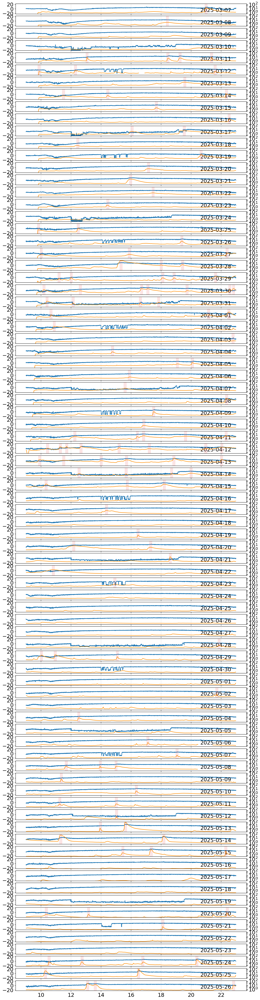

In [75]:
fig, axs = plt.subplots(len(uniquedays[:-1]), 1, figsize=(14,60), sharey=True)
mu = 1e6
delta = np.timedelta64(30, 'm')
twinxs = []

day_hstart = 9
day_hend = 23
fmt = DateFormatter("%H:%M") 
for ii,day in enumerate(uniquedays[:-1]):
    print(day)
    tvlf = vlfdata.index[(day+np.timedelta64(day_hstart,'h')<vlfdata.index) & (vlfdata.index<day+np.timedelta64(day_hend,'h'))]
    tvlf = tvlf.hour + tvlf.minute/60 + tvlf.second/3600
    la, = axs[ii].plot(tvlf, 
             vlfdata["NAA"][(day+np.timedelta64(day_hstart,'h')<vlfdata.index) & (vlfdata.index<day+np.timedelta64(day_hend,'h'))] , 
             )
    
    axs[ii].text(0.8,0.2, str(day.date()),transform=axs[ii].transAxes )
    tax = axs[ii].twinx()
    twinxs.append(tax)
    axs[ii].set_ylim(-23,23)
    #tax.plot(xrdata["DateTime"][(day+np.timedelta64(day_hstart,'h')<xrdata["DateTime"]) & (xrdata["DateTime"]<day+np.timedelta64(day_hend,'h'))], 
    #         mu * xrdata["GOES-16_long"][(day+np.timedelta64(day_hstart,'h')<xrdata["DateTime"]) & (xrdata["DateTime"]<day+np.timedelta64(day_hend,'h'))] , 
    #         color= "firebrick", label="18_long")
    trx = xrdata.index[(day+np.timedelta64(day_hstart,'h')<xrdata.index) & (xrdata.index<day+np.timedelta64(day_hend,'h'))]
    trx = trx.hour + trx.minute/60 + trx.second/3600
    lxr, = tax.plot(trx, 
             mu * xrdata["GOES-18_long"][(day+np.timedelta64(day_hstart,'h')<xrdata.index) & (xrdata.index<day+np.timedelta64(day_hend,'h'))] , 
             color= "darkorange", label="18_long")
    #tax.legend(loc=1)
    #print(type(day), )
    tax.set_yscale("log")
    tax.set_ylim(0.5,150)
    
    #xx =axs[ii].set_xlim(day+np.timedelta64(day_hstart), day+np.timedelta64(day_hend))
    #print(xx)
    #minloc = AutoMinorLocator(5)
    #tax.yaxis.set_minor_locator(minloc)
    #axs[ii].xaxis.set_major_formatter(fmt)
    for ft in flaresdf.index.values:
        #if ft.astype("datetime64[D]") == day:
        if (day+np.timedelta64(day_hstart,'h')<ft) & \
            (ft<day+np.timedelta64(day_hend,'h')):
            tt = pd.Timestamp(ft)
            tt = tt.hour+tt.minute/60+tt.second/3600
            lf =tax.axvspan(tt-5/60, 
                        tt+5/60, 
                        alpha=0.2, color="lightcoral")
            #print(ft)
    axs[ii].grid(axis='x', linestyle = ":")
#axs[-1].xaxis.set_major_formatter(fmt)
twinxs[0].get_shared_y_axes().join(*twinxs)            
plt.subplots_adjust(hspace=0)
axs[-1].set_xlabel("Hora (UT)")
#fig.autofmt_xdate(rotation=0,ha="center")
axs[1].set_ylabel("Amplitud (dB)")
twinxs[1].set_ylabel("Flujo de Rayos X ($\mu W/m^2$)")
#plt.lege
plt.legend((la,lxr,lf), ('VLF',"X-ray Fux", "Flare"),bbox_to_anchor=(0.47, -0.4), ncol=3)


In [45]:
vlfdata["DateTime"][(day+np.timedelta64(day_hstart,'h')<vlfdata["DateTime"]) & (vlfdata["DateTime"]<day+np.timedelta64(day_hend,'h'))]

Series([], Name: DateTime, dtype: datetime64[ns])

In [92]:
vlfdata

,NWC,NPM,JJI,NAA,NLK,NLM,DateTime
0,-4.133636,-2.102016,-12.066951,6.657418,-11.356432,-13.092483,2023-11-02 16:07:15
1,-4.197850,-2.008059,-12.007452,6.500192,-11.743398,-13.275255,2023-11-02 16:07:24
2,-4.262064,-1.914102,-11.947952,6.342966,-12.130364,-13.458027,2023-11-02 16:07:34
3,-4.326279,-1.820145,-11.888452,6.185740,-12.517330,-13.640799,2023-11-02 16:07:43
4,-4.390493,-1.726187,-11.828953,6.028514,-12.904296,-13.823571,2023-11-02 16:09:49
...,...,...,...,...,...,...,...
94109,-4.839173,-7.371179,-8.867039,4.215637,-3.962896,-10.185599,2023-11-15 17:57:10
94110,-4.941916,-7.228033,-9.155905,4.318973,-4.092685,-10.426887,2023-11-15 17:57:19
94111,-5.044659,-7.084887,-9.444772,4.422308,-4.222475,-10.668174,2023-11-15 17:57:29
94112,-5.147401,-6.941741,-9.733638,4.525644,-4.352265,-10.909461,2023-11-15 17:57:38


In [93]:
fig.savefig(os.getcwd()+'/XXX_localday_flaresobserved_juni0.png', dpi=300)#datapath

In [94]:
vlfdata["DateTime"].dt.second

0        15
1        24
2        34
3        43
4        49
         ..
94109    10
94110    19
94111    29
94112    38
94113    48
Name: DateTime, Length: 94114, dtype: int32

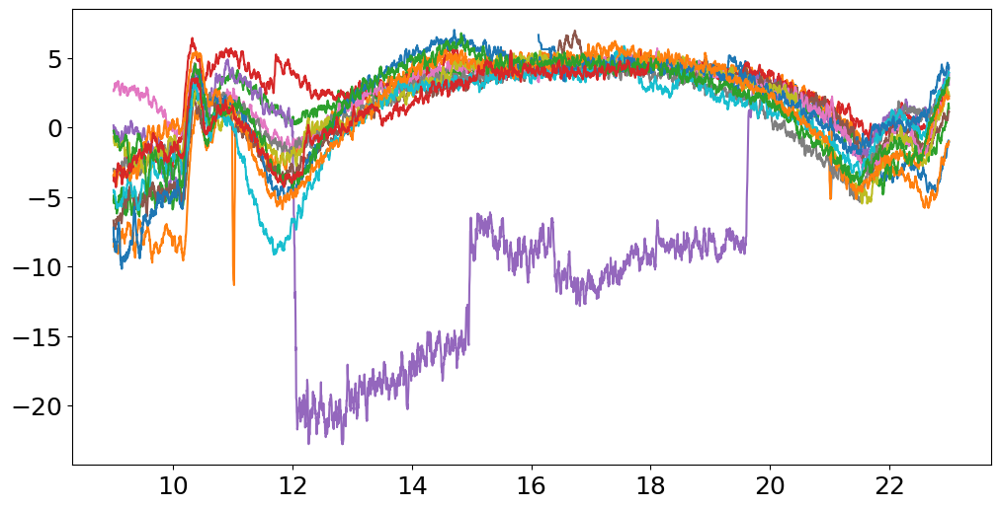

In [96]:


fig = plt.figure(figsize=(12,6))
for ii, day in enumerate(uniquedays):
    tx = vlfdata["DateTime"][(day+np.timedelta64(day_hstart,'h')<vlfdata["DateTime"]) & (vlfdata["DateTime"]<day+np.timedelta64(day_hend,'h'))]
    th = tx.dt.hour + tx.dt.minute/60 + tx.dt.second/3600
    plt.plot(th, 
             vlfdata["NAA"][(day+np.timedelta64(day_hstart,'h')<vlfdata["DateTime"]) & (vlfdata["DateTime"]<day+np.timedelta64(day_hend,'h'))] , label="")

In [43]:
fig.savefig("superpuestas.png", dpi=600)

In [16]:
dts = np.diff(vlfdata["DateTime"].iloc[100:])/np.timedelta64(1,'s')
plt.subplot(211)
plt.plot(vlfdata["DateTime"].iloc[10:50], "o")
plt.subplot(212)
plt.plot(dts[:50], marker="s", markerfacecolor="none")

NameError: name 'vlfdata' is not defined

In [63]:
dts/np.timedelta64(1, 's')

array([10.,  9.,  9., ..., 10.,  9., 10.])

# QUIET DAYS: 

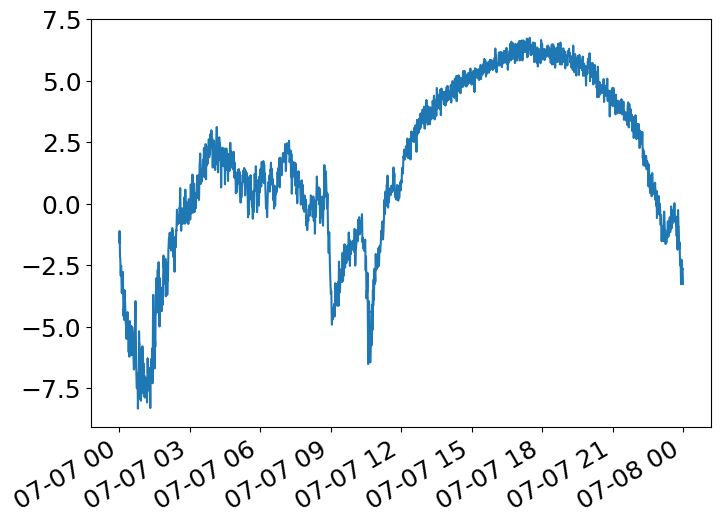

In [85]:

def to_stddt(t, tref=dt.date.today()):
    '''t : array of time elements
        tref: reference date
    Returnds: datetime
    '''
    
    y =[dt.datetime.combine(tref, x) for x in t]
    return np.asarray(y)



qdays = [np.datetime64("2025-05-02")]#, np.datetime64("2025-04-27")]

x = len(vlfdata.index[(qdays[0]<vlfdata.index) & (vlfdata.index<qdays[0]+np.timedelta64(24,'h'))]) 
quiet_day = np.zeros(x)
for ii, d in enumerate(qdays):
    quiet_day += vlfdata["NAA-filt"][(d<vlfdata.index) & (vlfdata.index<d+np.timedelta64(24,'h'))].values
quiet_day /= len(qdays)

t = vlfdata.index[(d<vlfdata.index) & 
                                (vlfdata.index<d+np.timedelta64(24,'h'))]
th = t.time
th_quiet_day = to_stddt(th) 
fig = plt.figure()
plt.plot(th_quiet_day, quiet_day)
#plt.plot(th, vlfdata["NAA"][(d<vlfdata["DateTime"]) & 
#                                (vlfdata["DateTime"]<d+np.timedelta64(24,'h'))].values)
#plt.show()
fig.autofmt_xdate()

In [86]:
th_quiet_day = pd.Series([pd.Timestamp(x) for x in th_quiet_day])

In [87]:
tref_h = th_quiet_day.dt.hour + th_quiet_day.dt.minute/60 + th_quiet_day.dt.second/3600

# Finding perturbations

In [88]:
delta_obs = np.timedelta64(30,'m')
delta_flare = np.timedelta64(10,'m')

## Match between VLF and XRays Flux

In [89]:
def nearest_dt(target, dtv):
    '''target is an array or single value (to find)
    dtv is the array to look/search in 
    '''# dtv is the array to look/search in 
    if len(target)==1:
        return np.argmin(abs(np.asarray(dtv)-target))
    else:
        return np.asarray([np.argmin(abs(dtv-t)) for t in target])

In [228]:
flares_index_invlf = nearest_dt(flaresdf_localday.index, vlfdata.index)

In [229]:
flares_index_invlf

array([  5942,  13898,  38647,  40642,  40945,  41723,  47270,  50719,
        58880,  64789,  65886,  68814,  75996,  86706,  93222,  94512,
       100788, 112740, 120343, 128794, 138257, 146048, 163120, 174569,
       182167, 184582, 190860, 191854, 192379, 198223, 198526, 200788,
       201066, 202092, 207649, 209163, 209317, 210287, 211342, 211435,
       216366, 218029, 218480, 228613, 229113, 247012, 252932, 263427,
       263798, 271140, 279932, 291336, 298432, 307059, 314250, 315795,
       315949, 316986, 317986, 322787, 322948, 323301, 324241, 324988,
       326383, 326779, 331773, 332701, 333325, 334493, 335674, 341051,
       342213, 343336, 343818, 351143, 352056, 368429, 387004, 394311,
       396208, 405589, 422009, 469055, 475441, 504582, 518964, 538455,
       548069, 554223, 555064, 555453, 562998, 573753, 580759, 582157,
       591057, 599552, 600175, 607466, 610010, 617890, 618594, 620432,
       661499, 664924, 672225, 696907, 698409, 699743, 707199, 714830,
      

In [107]:
plt.rcParams['legend.handlelength'] = 0
plt.rcParams['font.size'] = 12

There are dome index to delete yet from flares_index_invlf

In [126]:
diffvlf = vlfdata.diff(periods=17)
diffvlf.head()

,NPM,NAA,NLK,NLM,NAU,NPM-filt,NAA-filt,NLK-filt,NLM-filt,NAU-filt
2025-03-07 05:00:07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-03-07 05:00:17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-03-07 05:00:27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-03-07 05:00:36,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-03-07 05:00:46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


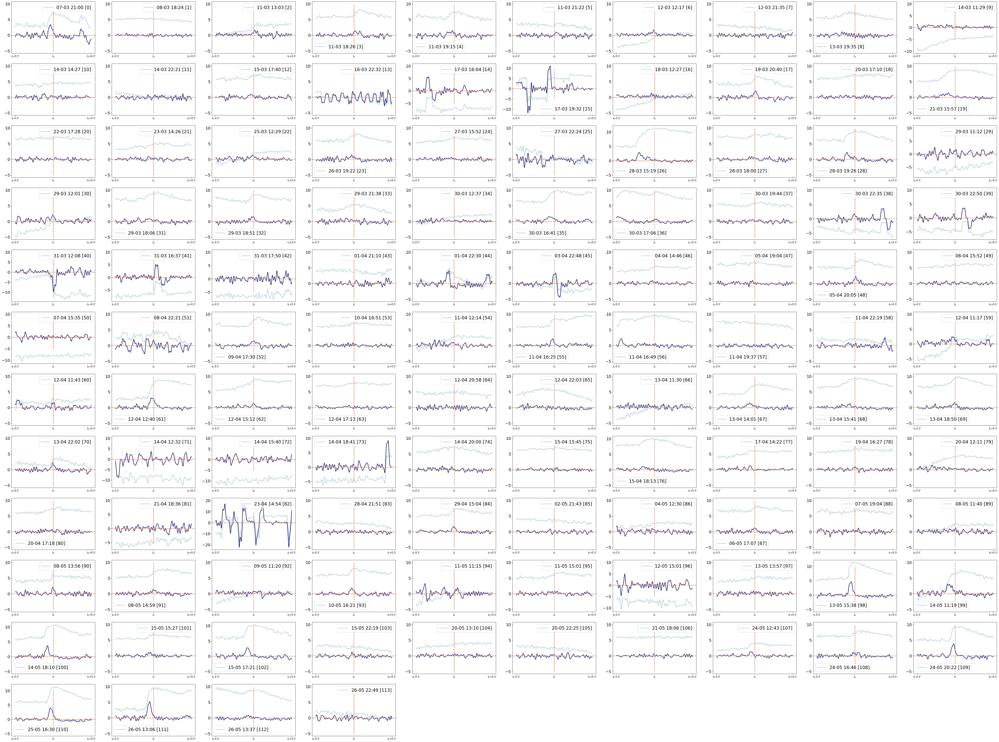

In [127]:
fig = plt.figure( figsize=(80,60))

fmt = DateFormatter("%H:%M")    
axs[-1].xaxis.set_major_formatter(fmt)

for ii, k in enumerate(flares_index_invlf):
    ax = plt.subplot(12,10, ii+1)
    t0 = vlfdata.index[k]
    #print(t0)
    mask = (vlfdata.index>t0 - delta_obs) & (vlfdata.index<t0+delta_obs)
    t = vlfdata.index[mask]
    amp = vlfdata["NAA-filt"].loc[mask]
    t_d = diffvlf.index[mask]
    damp = diffvlf["NAA-filt"].loc[mask]
    plt.plot(t, amp, label=f"{t0.strftime("%d-%m %H:%M")} [{ii}]", alpha=0.5)
    plt.plot(t_d, damp, color="darkblue", lw=2)
    plt.legend(fontsize=20, markerscale=0,numpoints=1)
    ax.set_xticks([t0 - delta_obs,t0,t0 + delta_obs])
    ax.set_xticklabels(["$t_0$-{}'".format(delta_obs/np.timedelta64(60,'m')),"$t_0$", "$t_0$+{}'".format( delta_obs/np.timedelta64(60,'m')) ],fontsize=11)
    ax.vlines(t0, -5,10, linestyle="--", lw=2, color="coral", alpha=1)
    ax.axhline(0, linestyle="--", lw=2, color="coral", alpha=1)

    ax2 = ax.twinx()
    #ax.axes.xaxis.set_visible(False)
    #fmt = DateFormatter("%H:%M:%S")    
    #ax.xaxis.set_major_formatter(fmt)

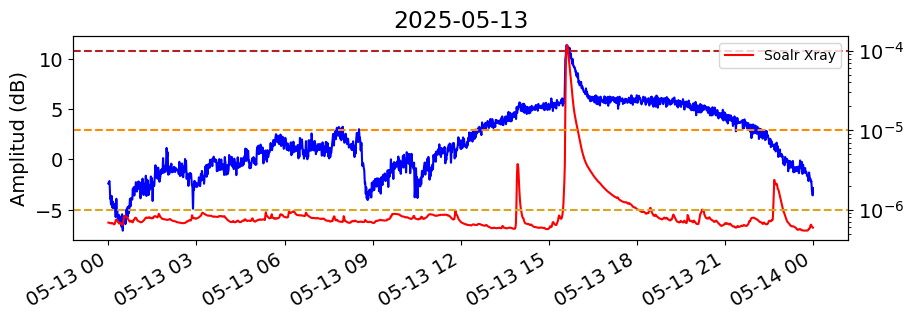

In [213]:
di = dt.datetime(2025, 5,13)
df = di + dt.timedelta(hours=24)

fig = plt.figure(figsize=(10,3))
plt.plot( dndata['NAA-filt'].loc[di:df], marker="none",color="blue",alpha=1, label="medido")
plt.ylabel("Amplitud (dB)")
ax = plt.gca().twinx()
ax.plot( xrdata['GOES-18_long'].loc[di:df], marker="none",alpha=1, label="Soalr Xray", color="red")
plt.xlabel("Tiempo")
ax.set_yscale("log")
ax.axhline(1e-6, ls="--", color="goldenrod")
ax.axhline(1e-5, ls="--", color="darkorange")
ax.axhline(1e-4, ls="--", color="firebrick")
plt.legend( fontsize=10)
plt.title(di.date())
fig.autofmt_xdate()

In [246]:
ifall = [14 ,15 ,37,38,39,40,41,42,81,82,96]
inone = [1,7,9,10,13,18,20,21,22,24,25,27,29,34,37,38,39,43,49,50,51,54,57,71,72,73,104,105,106,113]
discard = ifall + inone

In [190]:
diffvlf = vlfdata.diff(periods=17)
diffvlf.head()

,NPM,NAA,NLK,NLM,NAU,NPM-filt,NAA-filt,NLK-filt,NLM-filt,NAU-filt,NAA-filt-enh
2025-03-07 05:00:07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-03-07 05:00:17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-03-07 05:00:27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-03-07 05:00:36,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-03-07 05:00:46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Pattern enhacement

Text(0, 0.5, 'f(t)')

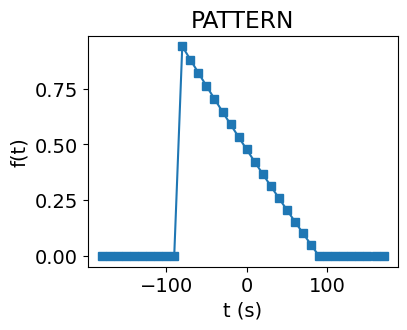

In [216]:
fig = plt.figure(figsize=(4,3))
t_ = np.arange(-180,180, 10) # 10s step 0 to 1h
pattern = np.zeros(len(t_))
t1 = -90; t2 = 90
A = 1/(np.exp(-(t1-t2)/1000 )-1)
mask = (t1<t_) & (t2>t_)
pattern[mask] = A*(np.exp(-(t_[mask]-t2)/1000 )-1)

plt.plot(t_, pattern, marker="s")
plt.title("PATTERN")
plt.xlabel("t (s)"); plt.ylabel("f(t)")


In [221]:
vlfdata["NAA-filt-enh"] = np.convolve(vlfdata["NAA-filt"], pattern , "same")
diffvlf = vlfdata.diff(periods=17)
diffvlf.head()

,NPM,NAA,NLK,NLM,NAU,NPM-filt,NAA-filt,NLK-filt,NLM-filt,NAU-filt,NAA-filt-enh
2025-03-07 05:00:07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-03-07 05:00:17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-03-07 05:00:27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-03-07 05:00:36,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-03-07 05:00:46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [218]:
plt.rcParams["font.size"] = 14

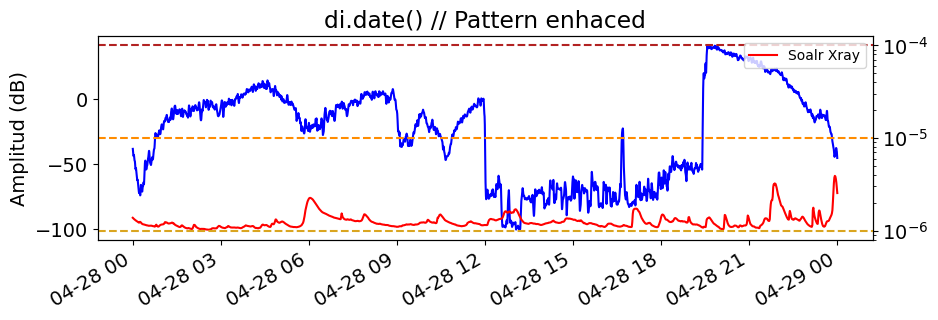

In [245]:

di = dt.datetime(2025, 4,28)
df = di + dt.timedelta(hours=24)

fig = plt.figure(figsize=(10,3))
plt.plot( dndata['NAA-filt-enh'].loc[di:df], marker="none",color="blue",alpha=1, label="medido")
plt.ylabel("Amplitud (dB)")
ax = plt.gca().twinx()
ax.plot( xrdata['GOES-18_long'].loc[di:df], marker="none",alpha=1, label="Soalr Xray", color="red")
plt.xlabel("Tiempo")
ax.set_yscale("log")
ax.axhline(1e-6, ls="--", color="goldenrod")
ax.axhline(1e-5, ls="--", color="darkorange")
ax.axhline(1e-4, ls="--", color="firebrick")
plt.legend( fontsize=10)
plt.title(f"di.date() // Pattern enhaced")
fig.autofmt_xdate()

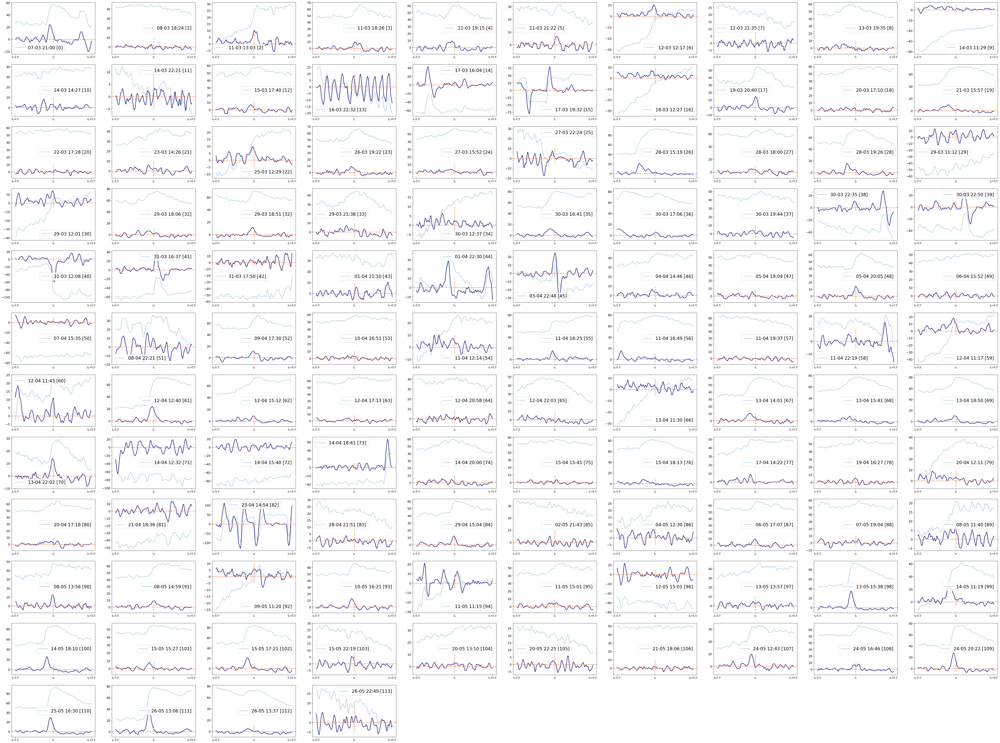

In [222]:
fig = plt.figure( figsize=(80,60))

fmt = DateFormatter("%H:%M")    
axs[-1].xaxis.set_major_formatter(fmt)

for ii, k in enumerate(flares_index_invlf):
    ax = plt.subplot(12,10, ii+1)
    t0 = vlfdata.index[k]
    #print(t0)
    mask = (vlfdata.index>t0 - delta_obs) & (vlfdata.index<t0+delta_obs)
    t = vlfdata.index[mask]
    amp = vlfdata["NAA-filt-enh"].loc[mask]
    t_d = diffvlf.index[mask]
    damp = diffvlf["NAA-filt-enh"].loc[mask]
    plt.plot(t, amp, label=f"{t0.strftime("%d-%m %H:%M")} [{ii}]", alpha=0.5)
    plt.plot(t_d, damp, color="darkblue", lw=2)
    plt.legend(fontsize=20, markerscale=0,numpoints=1)
    ax.set_xticks([t0 - delta_obs,t0,t0 + delta_obs])
    ax.set_xticklabels(["$t_0$-{}'".format(delta_obs/np.timedelta64(60,'m')),"$t_0$", "$t_0$+{}'".format( delta_obs/np.timedelta64(60,'m')) ],fontsize=11)
    ax.vlines(t0, -5,10, linestyle="--", lw=2, color="coral", alpha=1)
    ax.axhline(0, linestyle="--", lw=2, color="coral", alpha=1)
    #ax.axes.xaxis.set_visible(False)
    #fmt = DateFormatter("%H:%M:%S")    
    #ax.xaxis.set_major_formatter(fmt)

In [224]:
def h_from_timestamp(dt):
    dt = pd.T(dt)
    th = dt.dt.hour + dt.dt.minute/60 + dt.dt.second/3600 
    return th

def match_hours(t0, tv):
    """
    returns ii which is the closest element index of tv to t0
    """
    tvh = tv.dt.hour + tv.dt.minute/60 + tv.dt.second/3600 
    t0h = t0.hour + t0.minute/60 + t0.second/3600
    ii = np.argmin(abs(tvh-t0h))
    return ii

In [247]:
flares_index_invlf2 = [ii for k,ii in enumerate(flares_index_invlf) if k not in discard] 
len(flares_index_invlf2),len(flares_index_invlf), len(discard) 

(76, 114, 41)

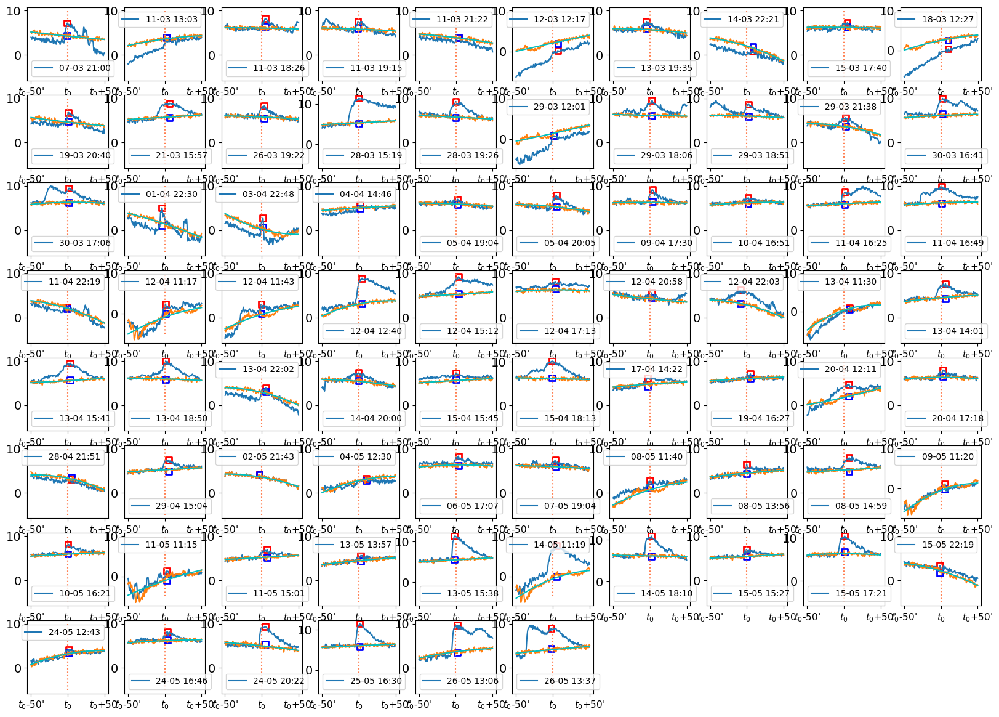

In [311]:
delta_obs = np.timedelta64(50,'m')

fig = plt.figure( figsize=(20,20))
pdelta = []
fmt = DateFormatter("%H:%M")    
axs[-1].xaxis.set_major_formatter(fmt)
vlfdata["state"] = 1 # 1=normal / 2=flare
vlfdata["state_point"] = 1 # 1=normal / 2=flare
located_events = []
PREVPERCENT = 10
for ii, k in enumerate(flares_index_invlf2):
    ax = plt.subplot(11,10, ii+1)
    t0 = vlfdata.index[k]
    t0_h = t0.hour+t0.minute/60+t0.second/3600
    delta_obs_h = delta_obs/np.timedelta64(1,'h')
    #print(t0)
    t0_ = t0.time
    mask = (vlfdata.index>t0 - delta_obs) & (vlfdata.index<t0+delta_obs)
    mask_loc = (vlfdata.index>t0 - delta_flare) & (vlfdata.index<t0+delta_flare)
    t = vlfdata.index[mask]
    amp = vlfdata["NAA-filt"].loc[mask].values
    t0h = t.hour + t.minute/60 + t.second/3600
    plt.plot(t0h, amp, label=t0.strftime("%d-%m %H:%M"))
    plt.legend(fontsize=10, markerscale=0,numpoints=1)
    ax.set_xticks([t0_h - delta_obs_h,t0_h,t0_h + delta_obs_h])
    ax.set_xticklabels(["$t_0$-{}'".format(delta_obs.astype(int)),"$t_0$", "$t_0$+{}'".format( delta_obs.astype(int)) ],fontsize=11)
    ax.vlines(t0_h, -5,10, linestyle=":", color="coral", alpha=1)
    # local max
    mask = (tref_h>t0_h - delta_obs_h) & (tref_h<t0_h+delta_obs_h)
    #t = vlfdata.index.loc[mask]
    plt.plot(tref_h[mask],quiet_day[mask])
    #amp = vlfdata["NAA"].loc[mask].values
    amp = vlfdata["NAA-filt"].loc[mask_loc].values
    tamp = vlfdata.index[mask_loc].values
    
    im = np.argmax(amp)
    t_locmax = tamp[im]
    t_locmax = t_locmax.astype('datetime64[s]').astype(object).hour + \
                t_locmax.astype('datetime64[s]').astype(object).minute / 60 + \
                t_locmax.astype('datetime64[s]').astype(object).second / 3600
    locmax = amp[im]
    tamp = vlfdata["NAA-filt"].index[mask_loc].values[im]
    #pert = amp[im]
    ci = match_hours(t0, th_quiet_day)
    a0 = quiet_day[ci]
    deltas.append(locmax-a0)
    window_indices = np.where(mask_loc==True)[0]
    indices_to_update = window_indices -int(im*PREVPERCENT/100) # a band around the peak
    indice_to_update_0 = window_indices[0]+im # single point peak
    vlfdata.iloc[indices_to_update, vlfdata.columns.get_loc("state")] = 2
    vlfdata.iloc[indice_to_update_0,vlfdata.columns.get_loc("state_point")] = 2
    model = np.poly1d(np.polyfit(tref_h[mask], quiet_day[mask], 2))
    ymodel = model(tref_h[mask])
    pdelta.append(locmax-ymodel[im])
    plt.plot(tref_h[mask],ymodel, color="c")
    ax.set_xticks([t0_h - delta_obs_h,t0_h,t0_h + delta_obs_h])
    plt.scatter(t_locmax, locmax,edgecolors="r",c="none", marker="s",s=50,linewidths=2)
    plt.scatter(t_locmax, a0, edgecolors="b",c="none", marker="s",s=50,linewidths=2)
    #ax.axes.xaxis.set_visible(False)
    #fmt = DateFormatter("%H:%M:%S")    
    #ax.xaxis.set_major_formatter(fmt)

In [289]:
indice_to_update_0

np.int64(715008)

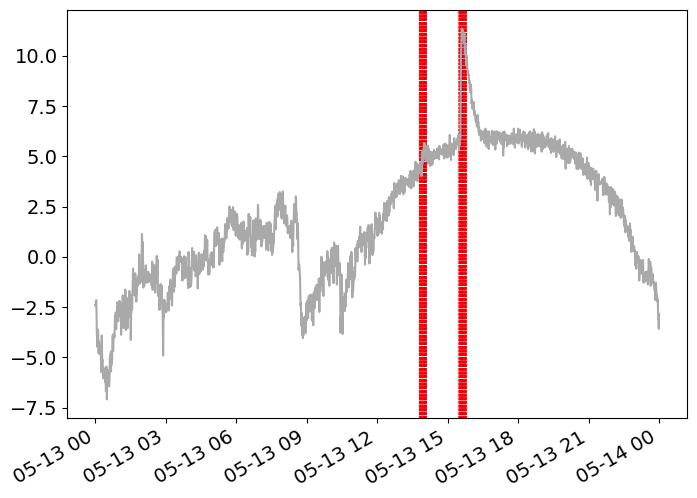

In [300]:
di = dt.datetime(2025, 5, 13)
df = di + dt.timedelta(hours=24)

dframe = vlfdata.loc[di:df]
dframe["NAA-filt"].plot(color="darkgray")
mask = np.where(dframe["state"]==2)
for d in dframe.index[mask]:
    plt.axvline(d, linestyle="--", color="red", lw=0.5, alpha=0.5, zorder=0)

mask = np.where(dframe["state_point"]==2)
for d in dframe.index[mask]:
    plt.axvline(d, linestyle="--", color="blue", lw=0.5, alpha=0.5, zorder=0)


In [302]:
vlfdata[["NAA", "NAA-filt", "state", "state_point"]].to_csv("/data/pavnet/2025/PIURA/NAA_serie_states.csv", index_label="DateTime")

In [280]:
np.where(mask_loc==True)

(array([714960, 714961, 714962, 714963, 714964, 714965, 714966, 714967,
        714968, 714969, 714970, 714971, 714972, 714973, 714974, 714975,
        714976, 714977, 714978, 714979, 714980, 714981, 714982, 714983,
        714984, 714985, 714986, 714987, 714988, 714989, 714990, 714991,
        714992, 714993, 714994, 714995, 714996, 714997, 714998, 714999,
        715000, 715001, 715002, 715003, 715004, 715005, 715006, 715007,
        715008, 715009, 715010, 715011, 715012, 715013, 715014, 715015,
        715016, 715017, 715018, 715019, 715020, 715021, 715022, 715023,
        715024, 715025, 715026, 715027, 715028, 715029, 715030, 715031,
        715032, 715033, 715034, 715035, 715036, 715037, 715038, 715039,
        715040, 715041, 715042, 715043, 715044, 715045, 715046, 715047,
        715048, 715049, 715050, 715051, 715052, 715053, 715054, 715055,
        715056, 715057, 715058, 715059, 715060, 715061, 715062, 715063,
        715064, 715065, 715066, 715067, 715068, 715069, 715070, 

In [303]:
#flares_index_invlf = [flares_index_invlf[0]] #np.delete(flares_index_invlf, [])
flares_index_invlf = flares_index_invlf

In [308]:
len(flares_index_invlf)

114

2025-03-07 21:00:00
2025-03-11 13:03:57
2025-03-11 18:26:55
2025-03-11 19:15:59
2025-03-11 21:22:02
2025-03-12 12:17:59
2025-03-13 19:35:04
2025-03-14 22:21:02
2025-03-15 17:40:55
2025-03-18 12:27:02
2025-03-19 20:40:02
2025-03-21 15:57:58
2025-03-26 19:22:55
2025-03-28 15:19:57
2025-03-28 19:26:02
2025-03-29 12:01:03
2025-03-29 18:06:56
2025-03-29 18:51:58
2025-03-29 21:38:04
2025-03-30 16:41:59
2025-03-30 17:06:56
2025-04-01 22:30:59
2025-04-03 22:48:04
2025-04-04 14:46:03
2025-04-05 19:04:56
2025-04-05 20:05:01
2025-04-09 17:30:00
2025-04-10 16:51:03
2025-04-11 16:25:01
2025-04-11 16:49:57
2025-04-11 22:19:57
2025-04-12 11:17:01
2025-04-12 11:43:02
2025-04-12 12:40:04
2025-04-12 15:12:02
2025-04-12 17:13:02
2025-04-12 20:58:56
2025-04-12 22:03:04
2025-04-13 11:30:58
2025-04-13 14:01:01
2025-04-13 15:41:59
2025-04-13 18:50:56
2025-04-13 22:02:01
2025-04-14 20:00:01
2025-04-15 15:45:03
2025-04-15 18:13:01
2025-04-17 14:22:01
2025-04-19 16:27:59
2025-04-20 12:11:04
2025-04-20 17:18:01


Text(0.35, 0.03, 'Time relative to flare peak (UT)')

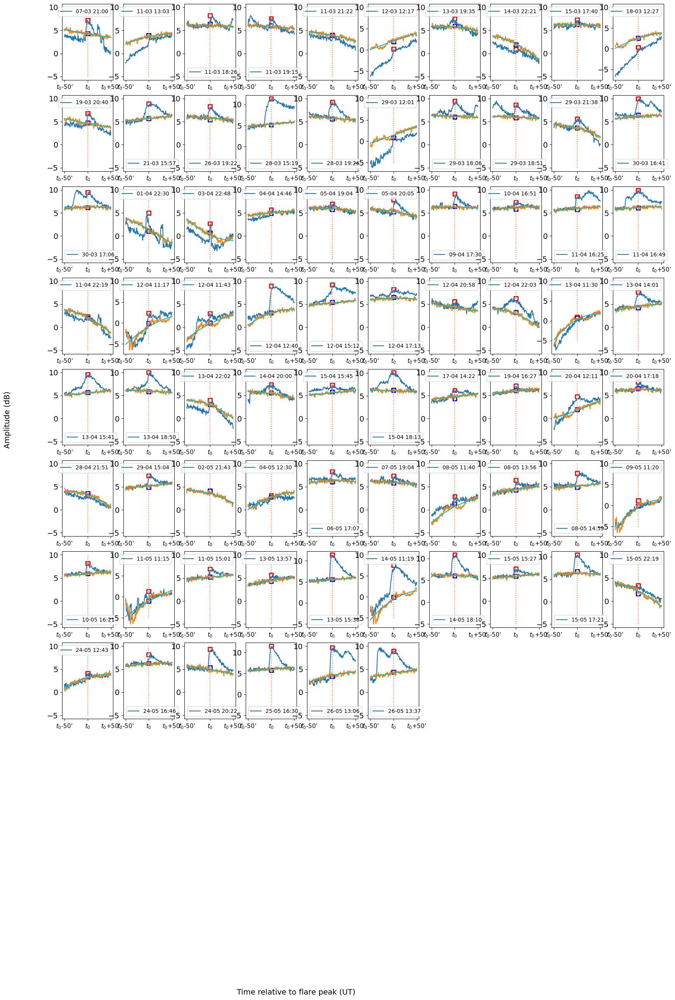

In [310]:
delta_obs = np.timedelta64(50,'m')

fig = plt.figure( figsize=(20,30))

fmt = DateFormatter("%H:%M")    
axs = []
deltas = []
pdelta = []
for ii, k in enumerate(flares_index_invlf2):
    ax = plt.subplot(10,10, ii+1)
    t0 = vlfdata.index[k]
    t0_h = t0.hour+t0.minute/60+t0.second/3600
    delta_obs_h = delta_obs/np.timedelta64(1,'h')
    print(t0)
    t0_ = t0.time()
    mask = (vlfdata.index>t0 - delta_obs) & (vlfdata.index<t0+delta_obs)
    mask_loc = (vlfdata.index>t0 - delta_flare) & (vlfdata.index<t0+delta_flare)
    t = vlfdata.index[mask]
    amp = vlfdata["NAA-filt"].loc[mask].values
    t0h = t.hour + t.minute/60 + t.second/3600
    plt.plot(t0h, amp, label=t0.strftime("%d-%m %H:%M"))
    plt.legend(fontsize=10, markerscale=0,numpoints=1)
    ax.set_xticks([t0_h - delta_obs_h,t0_h,t0_h + delta_obs_h])
    ax.set_xticklabels(["$t_0$-{}'".format(delta_obs.astype(int)),"$t_0$", "$t_0$+{}'".format( delta_obs.astype(int)) ],fontsize=11)
    ax.vlines(t0_h, -5,10, linestyle=":", color="coral", alpha=1)
    # local max
    mask = (tref_h>t0_h - delta_obs_h) & (tref_h<t0_h+delta_obs_h)
    #t = vlfdata.index.loc[mask]
    plt.plot(tref_h[mask],quiet_day[mask])
    #amp = vlfdata["NAA"].loc[mask].values
    amp = vlfdata["NAA-filt"].loc[mask_loc].values
    im = np.argmax(amp)
    locmax = amp[im]
    ci = match_hours(t0, th_quiet_day)
    a0 = quiet_day[ci]
    deltas.append(locmax-a0)
    model = np.poly1d(np.polyfit(tref_h[mask], quiet_day[mask], 2))
    ymodel = model(tref_h[mask])
    
    plt.plot(tref_h[mask],ymodel, color="c")
    plt.scatter(t0_h, locmax,edgecolors="r",c="none", marker="s",s=50,linewidths=2)
    plt.scatter(t0_h, a0, edgecolors="b",c="none", marker="s",s=50,linewidths=2)
    pdelta.append(locmax-a0)
    #ax.axes.xaxis.set_visible(False)
    #fmt = DateFormatter("%H:%M:%S")    
    #ax.xaxis.set_major_formatter(fmt)
    axs.append(ax)
fig.text(0.05,0.5,"Amplitude (dB)",rotation="vertical")
#axs[-1].set_xlabel("time (UT)", loc="right")
fig.text(0.35,0.03, "Time relative to flare peak (UT)")

In [104]:
k


32606

In [313]:
flares_index_inrx = nearest_dt(vlfdata.index[flares_index_invlf2], flaresdf_localday.index )

In [114]:
vlfdata.index.loc[flares_index_invlf]

9342    2023-10-07 18:06:15
23762   2023-10-09 11:43:10
26450   2023-10-09 19:11:11
32606   2023-10-10 12:17:11
Name: DateTime, dtype: datetime64[ns]

In [321]:
flares = [vlfdata.index[flares_index_invlf2].values, 
          np.array(pdelta), 
          flaresdf_localday.index[flares_index_inrx].values, 
          flaresdf_localday["GOES-18_long"].iloc[flares_index_inrx].values]
flares = np.asarray(flares)


array([[1741381200000000000, 2.217807228591755, 1741381200000000000,
        1.602859811100643e-05],
       [1741698237000000000, 1.3468548611322473, 1741698240000000000,
        1.0947002920147497e-05],
       [1741717615000000000, 2.0754857216947986, 1741717620000000000,
        6.111791208240902e-06],
       [1741720559000000000, 1.5351308245957798, 1741720560000000000,
        7.229660695884377e-06],
       [1741728122000000000, -0.548590465452016, 1741728120000000000,
        9.601028978067916e-06],
       [1741781879000000000, -0.5361641822243581, 1741781880000000000,
        5.943518772255629e-06],
       [1741894504000000000, 1.611206269468937, 1741894500000000000,
        7.957377420098055e-06],
       [1741990862000000000, -2.498601698500097, 1741990860000000000,
        1.1546697351150215e-05],
       [1742060455000000000, 1.000402617920896, 1742060460000000000,
        4.152865130890859e-06],
       [1742300822000000000, -0.8201784094187885, 1742300820000000000,
        2.1

In [323]:
for l in flares:
    print(len(l))

76
76
76
76


In [324]:
flarescorr = pd.DataFrame(flares.T, columns=["UT_VLF", "delta_dB","UT_XR", "XRF"])

In [325]:
flarescorr

,UT_VLF,delta_dB,UT_XR,XRF
0,1741381200000000000,2.217807,1741381200000000000,0.000016
1,1741698237000000000,1.346855,1741698240000000000,0.000011
2,1741717615000000000,2.075486,1741717620000000000,0.000006
3,1741720559000000000,1.535131,1741720560000000000,0.000007
4,1741728122000000000,-0.54859,1741728120000000000,0.00001
...,...,...,...,...
71,1748105218000000000,2.319596,1748105220000000000,0.000005
72,1748118178000000000,3.755754,1748118180000000000,0.000022
73,1748190602000000000,5.804334,1748190600000000000,0.00009
74,1748264764000000000,7.029773,1748264760000000000,0.00003


In [326]:
flarescorr["UT_VLF"] = pd.to_datetime(flarescorr["UT_VLF"])
flarescorr["UT_XR"] = pd.to_datetime(flarescorr["UT_XR"])

In [327]:
flarescorr

,UT_VLF,delta_dB,UT_XR,XRF
0,2025-03-07 21:00:00,2.217807,2025-03-07 21:00:00,0.000016
1,2025-03-11 13:03:57,1.346855,2025-03-11 13:04:00,0.000011
2,2025-03-11 18:26:55,2.075486,2025-03-11 18:27:00,0.000006
3,2025-03-11 19:15:59,1.535131,2025-03-11 19:16:00,0.000007
4,2025-03-11 21:22:02,-0.54859,2025-03-11 21:22:00,0.00001
...,...,...,...,...
71,2025-05-24 16:46:58,2.319596,2025-05-24 16:47:00,0.000005
72,2025-05-24 20:22:58,3.755754,2025-05-24 20:23:00,0.000022
73,2025-05-25 16:30:02,5.804334,2025-05-25 16:30:00,0.00009
74,2025-05-26 13:06:04,7.029773,2025-05-26 13:06:00,0.00003


<>:3: SyntaxWarning: invalid escape sequence '\m'
<>:3: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_874012/2507640019.py:3: SyntaxWarning: invalid escape sequence '\m'
  plt.xlabel("Peak Solar Xray Flux ($\mu W/m²$)")


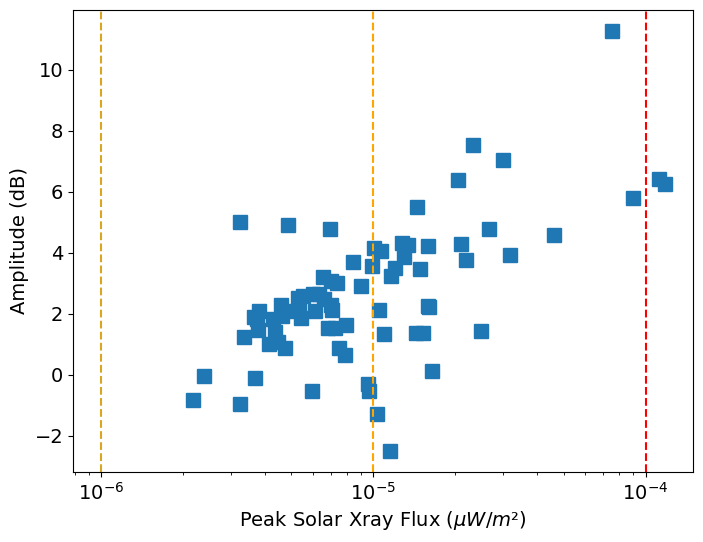

In [332]:
plt.plot(flarescorr["XRF"], flarescorr["delta_dB"], 's',markersize=10)
plt.ylabel("Amplitude (dB)")
plt.xlabel("Peak Solar Xray Flux ($\mu W/m²$)")
plt.axvline(1e-6, label="C", ls="--", color="goldenrod")
plt.axvline(1e-5, label="M", ls="--", color="orange")
plt.axvline(1e-4, label="X", ls="--", color="red")
plt.xscale("log")

In [121]:
flarescorr.to_csv("perturbations_{}--{}.csv".format(vlfdata["DateTime"].min(), vlfdata["DateTime"].max()))

### Correspoding $\Delta XRF$

In [333]:
iindxs = nearest_dt(t_pert, flaresdf_localday["Tiempo Universal"])

NameError: name 't_pert' is not defined

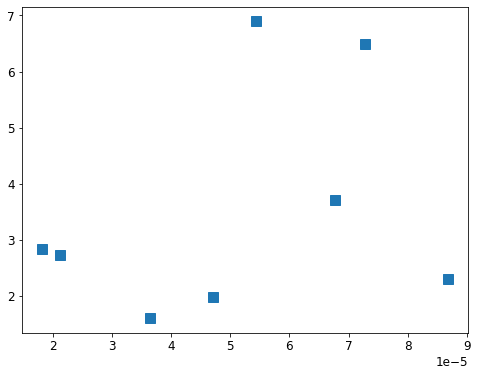

In [671]:
plt.plot(flaresdf_localday["GOES-17_long"].iloc[iindxs], pert_vals, 's',markersize=10)

NameError: name 'iindxs' is not defined

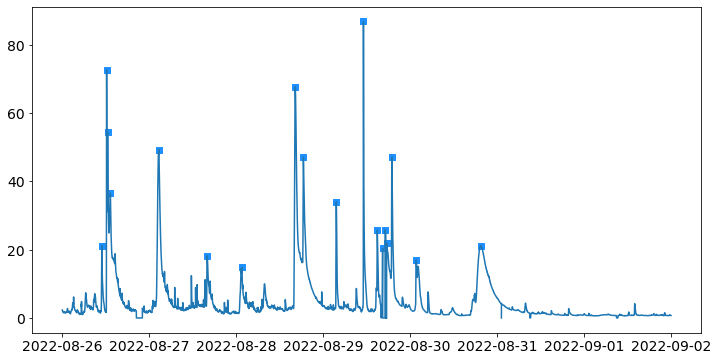

In [258]:
# finding peaks -> explosions
c = 1e6
peaks, x = signal.find_peaks(xrdata["GOES-17_long"].values*c,rel_height=10,distance=5, prominence=10)


fig = plt.figure(figsize=(12, 6))


plt.plot(xrdata['Tiempo Universal'], xrdata["GOES-17_long"]*c)
plt.scatter(xrdata['Tiempo Universal'].iloc[peaks], xrdata["GOES-17_long"].iloc[peaks]*c, marker='s', c="dodgerblue",label="Explosion detectada")
plt.scatter(flaresdf_localday['Tiempo Universal'].iloc[iindxs], flaresdf_localday["GOES-17_long"].iloc[iindxs]*c, marker='s', c="red",label="Explosion detectada")
fig.autofmt_xdate()

# C class flare region
plt.axhspan(1e-6*c,1e-5*c, color="yellow", alpha=0.3, label="Tipo C")
plt.axhspan(1e-5*c,1e-4*c, color="orange", alpha=0.3, label="Tipo M")
plt.axhspan(1e-4*c, 1.5*max(xrdata["GOES-17_long"])*c , color="red", alpha=0.3, label="Tipo X")
#plt.axhspan(1e-5,1e-5, color="yellow", alpha=0.3)
l = plt.legend(framealpha=1,facecolor='whitesmoke')
for l_ in l.legendHandles:
    l_._legmarker.set_markersize(6)
plt.ylabel("Flujo de Rayos X ($\mu Wm^{-2}$)")
plt.xlabel("Tiempo (Año-Mes-Día)")
plt.ylim(-2,120)
plt.xlim()

In [672]:
o=0

In [163]:
np

<module 'numpy' from '/home/aldo/pavnet_notebooks/pavnetenv/lib/python3.6/site-packages/numpy/__init__.py'>

# I need a Daily variatiuon of the VLF

(19229.950116898148, 19231.049836805556)
(19230.95010474537, 19232.04983738426)
(19231.95009201389, 19233.04985011574)
(19232.950116898148, 19234.049836805556)
(19233.950104166666, 19235.049849537038)
(19234.950104166666, 19236.049849537038)
(19235.95132349537, 19237.02424363426)


(-15.0, 15.0)

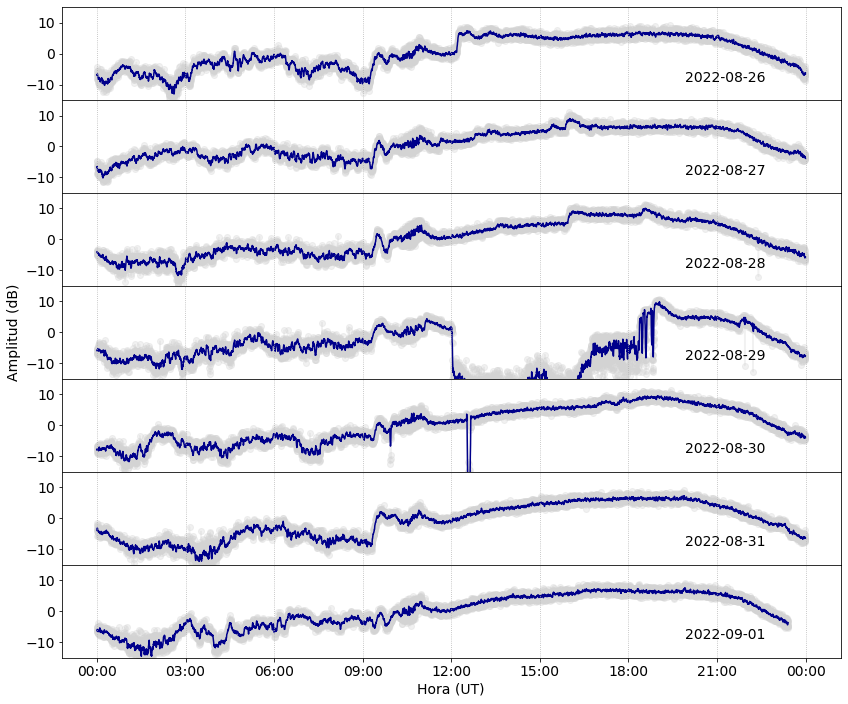

In [392]:
day_hstart = 0
day_hend = 24

fig, axs = plt.subplots(len(uniquedays), 1, figsize=(12,10), sharey=True)
mu = 1e6
delta = np.timedelta64(30, 'm')
twinxs = []


for ii,day in enumerate(uniquedays):
    axs[ii].plot(vlfdata["DateTime"][(day+np.timedelta64(day_hstart,'h')<vlfdata["DateTime"]) & (vlfdata["DateTime"]<day+np.timedelta64(day_hend,'h'))], 
             vlfdata["NAA"][(day+np.timedelta64(day_hstart,'h')<vlfdata["DateTime"]) & (vlfdata["DateTime"]<day+np.timedelta64(day_hend,'h'))] , 
             zorder=1, color="darkblue")
    axs[ii].plot(timevdn[(day+np.timedelta64(day_hstart,'h')<timevdn) & (timevdn<day+np.timedelta64(day_hend,'h'))], 
             dndatadb["NAA"][(day+np.timedelta64(day_hstart,'h')<timevdn) & (timevdn<day+np.timedelta64(day_hend,'h'))] , 
             zorder=0, marker='o', alpha=0.3,  color="lightgray")
    axs[ii].text(0.8,0.2, np.datetime_as_string(day,"D"),transform=axs[ii].transAxes )
    
    print(axs[ii].get_xlim())
    #tax = axs[ii].twinx()
    #twinxs.append(tax)
    
    #tax.plot(xrdata["Tiempo Universal"][(day+np.timedelta64(day_hstart,'h')<xrdata["Tiempo Universal"]) & (xrdata["Tiempo Universal"]<day+np.timedelta64(day_hend,'h'))], 
    #         mu * xrdata["GOES-17_long"][(day+np.timedelta64(day_hstart,'h')<xrdata["Tiempo Universal"]) & (xrdata["Tiempo Universal"]<day+np.timedelta64(day_hend,'h'))] , 
    #         color= "firebrick")
    #print(type(day), )
    #tax.set_yscale("log")
    #tax.set_ylim(1,1000)
    axs[ii].grid(axis='x', linestyle = ":")
    #lbls = [itm.get_text() for itm in tax.get_xticklabels()]
    #lbls[0] = None
    #tax.set_xticklabels(lbls)
    #for ft in flares_t.values:
    #    #if ft.astype("datetime64[D]") == day:
    #    if (day+np.timedelta64(day_hstart,'h')<ft) & \
    #        (ft<day+np.timedelta64(day_hend,'h')):
    #        tax.axvspan(ft-np.timedelta64(5,"m"), 
    #                    ft+np.timedelta64(5,"m"), 
    #                    alpha=0.2, color="lightcoral")
fmt = DateFormatter("%H:%M")    
axs[-1].xaxis.set_major_formatter(fmt)
            

axs[-1].set_xlabel("Hora (UT)")
fig.autofmt_xdate(rotation=0,ha="center")
axs[3].set_ylabel("Amplitud (dB)")
#twinxs[3].set_ylabel("Flujo de Rayos X ($\mu W/m^2$)")
axs[-1].axes.xaxis.set_minor_locator(MultipleLocator(3))
axs[-1].set_xlim(19234.950104166666+1, 19236.049849537038+1)
plt.tick_params(axis='x', which='minor', bottom=True)
plt.tight_layout()
plt.subplots_adjust(hspace=0)
axs[-1].set_ylim(-15,15)

In [269]:
datapath

'/data/Datos_PLO/PLO_250822-010922'

In [393]:
fig.savefig(datapath+"/dn_NAA_24h_260822-010922_rawandsavgol.png", dpi=300)

In [171]:
dndatadb.head()

,NWC,NPM,JJI,NAA,NLK,NLM
0,-59.398942,-67.182225,-66.156444,-65.400513,-66.061312,-64.965599
1,-0.837407,5.906655,-7.611368,6.674414,-1.560238,-1.190406
2,0.365779,6.093640,-6.741510,6.925561,-1.078238,0.949010
3,-1.307442,7.214048,-7.017894,6.691720,-0.786560,-0.325256
4,-2.282114,6.310740,-6.248962,5.471593,-0.370364,-0.138271


In [172]:
timevdn

array([datetime.datetime(2022, 8, 6, 10, 12, 42),
       datetime.datetime(2022, 8, 6, 10, 13, 7),
       datetime.datetime(2022, 8, 6, 10, 13, 13), ...,
       datetime.datetime(2022, 9, 1, 23, 24, 28),
       datetime.datetime(2022, 9, 1, 23, 24, 34),
       datetime.datetime(2022, 9, 1, 23, 24, 41)], dtype=object)

In [415]:
meas_flares = pd.read_csv(datapath+"/tab_flares.csv")

In [416]:
meas_flares

,Unnamed: 0,Tiempo (UT),Amp_0,Amp_1,XRF_0,XRF_1,delta_{VLF},delta_{XRflux}
0,0,26/08/22 12:14,0.23,6.54,2.1,73.0,6.31,70.9
1,1,26/08/22 12:31,5.93,7.17,30.3,55.3,1.24,24.9
2,2,26/08/22 13:16,5.03,7.05,25.5,36.7,2.01,11.2
3,3,27/08/22 11:38,2.41,4.16,3.5,8.8,1.75,5.3
4,4,27/08/22 12:48,3.53,5.26,3.3,9.5,1.73,6.2
5,5,27/08/22 13:13,0.72,2.42,3.5,11.9,1.75,8.4
6,6,27/08/22 15:25,4.91,7.56,3.5,10.8,2.64,7.3
7,7,27/08/22 15:58,5.68,8.53,3.7,18.5,2.84,14.8
8,8,28/08/22 16:18,5.25,8.99,3.5,67.8,3.74,64.3
9,9,28/08/22 18:32,7.85,9.88,16.6,47.4,2.03,30.7


In [417]:
meas_flares["delta_vlfamp"] = meas_flares["Amp_1"]-meas_flares["Amp_0"]
meas_flares["delta_rxflux"] = meas_flares["XRF_1"]-meas_flares["XRF_0"]

In [418]:
x, y = meas_flares["delta_rxflux"].sort_values() , meas_flares["delta_vlfamp"].sort_values()

In [419]:
x = np.asarray(x)
y = np.asarray(y)

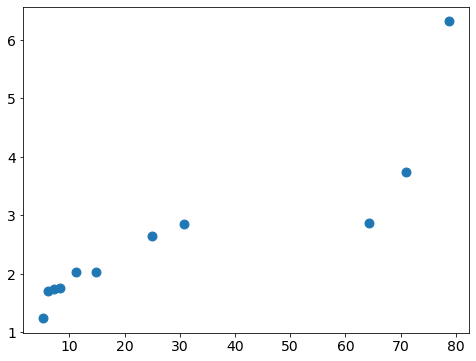

In [420]:

fig = plt.figure()
#plt.plot(x,y)
plt.scatter(x,y, s = 80)

In [421]:

#%matplotlib inline

In [422]:
from sklearn.linear_model import LinearRegression

In [423]:
model = LinearRegression()

In [424]:
model.fit(x.reshape(-1,1), y.reshape(-1,1))

LinearRegression()

In [425]:
y_pred = model.intercept_ + model.coef_ * x

Text(0, 0.5, '$\\Delta A_{VLF} \\quad (dB)$')

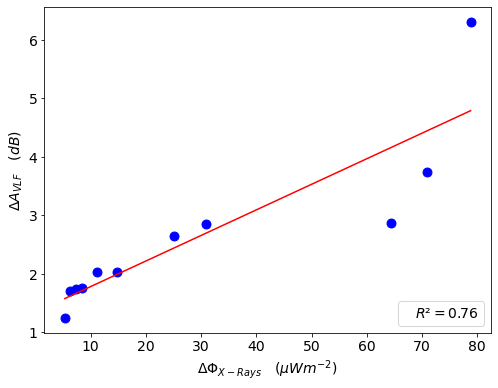

In [429]:

fig = plt.figure(figsize=(8,6))
#plt.plot(x,y)
plt.scatter(x,y, s = 80, c="blue")
plt.plot(x, y_pred.reshape(-1,1), color="r", label="$R²=%.2f$"%model.score(x.reshape(-1,1),y.reshape(-1,1)))
plt.legend(loc=4)
plt.xlabel("$\Delta\Phi_{X-Rays} \quad (\mu Wm^{-2})$")
plt.ylabel("$\Delta A_{VLF} \quad (dB)$")
#plt.xscale("log")

In [384]:
fig.savefig(datapath+"/correlation_vlf_xrf.png", dpi=300)

In [408]:
meas_flares.to_csv(datapath+"/tab_flares.csv")

### log scale

In [430]:
xlogs = np.log10(x)

In [431]:
modellog = LinearRegression()

In [432]:
modellog.fit(xlogs.reshape(-1,1), y.reshape(-1,1))

LinearRegression()

In [433]:
y_log_pred = modellog.intercept_ + modellog.coef_ * xlogs

Text(0, 0.5, '$\\Delta A_{VLF} \\quad (dB)$')

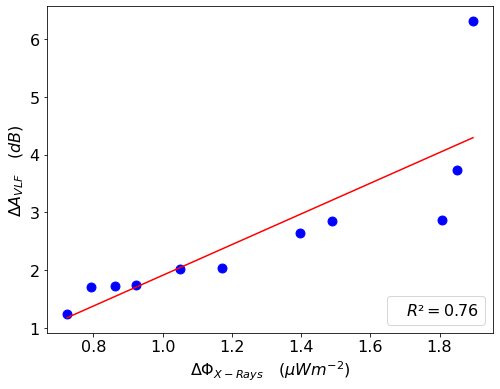

In [444]:
plt.rcParams["font.size"]=16
fig = plt.figure(figsize=(8,6))
#plt.plot(x,y)
plt.scatter(xlogs,y, s = 80, c="blue")
plt.plot(xlogs, y_log_pred.reshape(-1,1), color="r", label="$R²=%.2f$"%model.score(x.reshape(-1,1),y.reshape(-1,1)))
plt.legend(loc=4)
plt.xlabel("$\Delta\Phi_{X-Rays} \quad (\mu Wm^{-2})$")
plt.ylabel("$\Delta A_{VLF} \quad (dB)$")
#plt.xscale("symlog")
#plt.xlim(1,10)

## DELTA H with NPM

In [37]:
vlfdata

,NWC,NPM,JJI,NAA,NLK,NLM,DateTime
0,-4.085903,0.763003,-13.200257,4.755472,-10.330838,-5.056950,2023-02-23 15:11:06
1,-3.811732,0.968231,-12.799373,4.897108,-9.906221,-4.822381,2023-02-23 15:11:11
2,-3.551245,1.163430,-12.409951,5.031414,-9.501244,-4.599388,2023-02-23 15:11:15
3,-3.304442,1.348600,-12.031990,5.158389,-9.115908,-4.387971,2023-02-23 15:11:20
4,-3.071323,1.523741,-11.665492,5.278032,-8.750212,-4.188131,2023-02-23 15:11:24
...,...,...,...,...,...,...,...
109285,-4.233080,7.704511,-0.305932,-3.866032,-4.481108,-12.198512,2023-03-06 11:27:11
109286,-4.194328,8.183530,-0.375713,-3.962732,-4.400942,-12.763690,2023-03-06 11:27:16
109287,-4.148720,8.669149,-0.448586,-4.061816,-4.315417,-13.346874,2023-03-06 11:27:20
109288,-4.096255,9.161369,-0.524552,-4.163284,-4.224534,-13.948066,2023-03-06 11:27:25


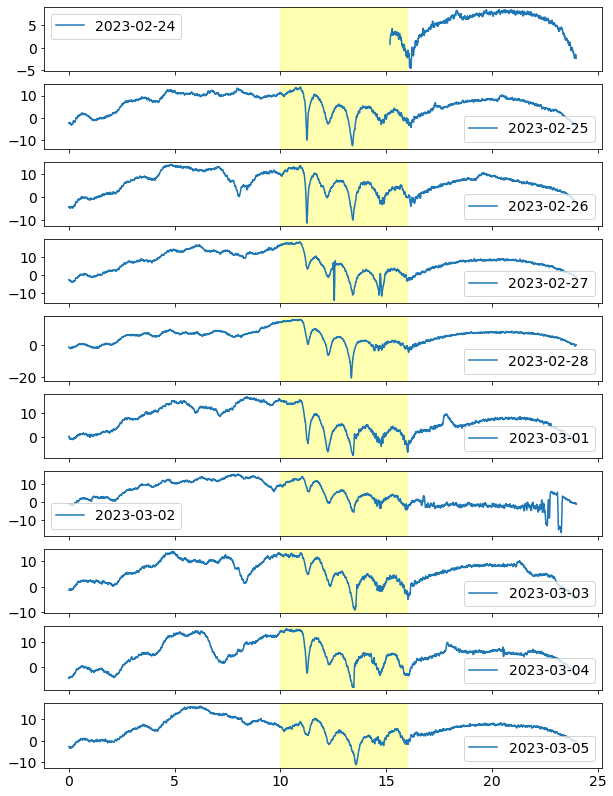

In [36]:
fig, ax = plt.subplots(nrows=len(uniquedays[1:-1]), figsize=(10, 14), sharex=True)

for k, tday in enumerate(uniquedays[1:-1]):
    
    mask = (vlfdata["DateTime"]<=tday) & (tday<vlfdata["DateTime"] + np.timedelta64(24, 'h'))
    th = vlfdata["DateTime"].loc[mask].dt.second/3600 + vlfdata["DateTime"].loc[mask].dt.minute/60 \
            +vlfdata["DateTime"].loc[mask].dt.hour
    ax[k].plot(th, vlfdata["NPM"].loc[mask], label="{}".format(tday))
    ax[k].axvspan(10, 16, color="yellow", alpha=0.3)
    ax[k].legend()

In [115]:
vlfdata["DateTime"].loc[mask].dt.hour/601

0       0.024958
1       0.024958
2       0.024958
3       0.024958
4       0.024958
          ...   
3628    0.038270
3629    0.038270
3630    0.038270
3631    0.038270
3632    0.038270
Name: DateTime, Length: 3633, dtype: float64